In [209]:
library(ballgown)
library(RSkittleBrewer)
library(genefilter)
library(devtools)
library(limma)
library(edgeR)
library(ggplot2)
library(DESeq2)
library(calibrate)
library(stringr)
library(ggrepel)
library(cluster)
library(Biobase)
library(qvalue)
library(EBSeq)
library(Rsamtools)
library(GenomicFeatures)
library(GenomicAlignments)
library(BiocParallel)
library(tximport)
library(readr)
library(tximportData)
library(apeglm)
library(knitr)
library(BiocParallel)
library(IHW)
library(ashr)
library(org.Hs.eg.db)
library(AnnotationDbi)
library(ReportingTools)
library(regionReport)
library(Glimma)
library(pcaExplorer)
library(DEVis)
library(vsn)
library(repr)
library(pheatmap)
library(RColorBrewer)
library(PoiClaClu)
library(glmpca)
library(ggbeeswarm)
library(genefilter)
library(Gviz)
library(TxDb.Hsapiens.UCSC.hg38.knownGene)
library(ensembldb)
library(EnsDb.Hsapiens.v86)
library(tximeta)
library(GenomicRanges)
library(biovizBase)
library(ggbio)
library(karyoploteR)
library(data.table)
library(gplots)
library(dplyr)
library(rnaseqDTU)
library(airway)
library(SummarizedExperiment)
library(PCAtools)
library(sva)
library(biomaRt)

In [2]:
register(MulticoreParam(70))

# STRINGTIE - DESeq2

In [34]:
countData <- as.matrix(read.csv("STRINGTIE_MERGE/c_gene_count_matrix.csv", row.names="gene_id"))
colData <- read.csv("BALLGOWN/c_experiment_data.csv", sep=",", row.names=1)
all(rownames(colData) %in% colnames(countData))

[1] TRUE

In [35]:
st_dds <- DESeqDataSetFromMatrix(countData = countData,
        colData = colData, design = ~ condition)

In [36]:
st_dds

class: DESeqDataSet 
dim: 75726 16 
metadata(1): version
assays(1): counts
rownames(75726): ENSG00000242268.3 ENSG00000270112.4 ...
  ENSG00000282059.1 ENSG00000274274.1
rowData names(0):
colnames(16): CBG01 CBG02 ... CBG15 CBG16
colData names(1): condition

In [37]:
keep <- rowSums(counts(st_dds)) > 16
st_dds <- st_dds[keep,]
st_dds

class: DESeqDataSet 
dim: 41391 16 
metadata(1): version
assays(1): counts
rownames(41391): ENSG00000280143.1 ENSG00000146083.12 ...
  ENSG00000236383.8 ENSG00000231119.2
rowData names(0):
colnames(16): CBG01 CBG02 ... CBG15 CBG16
colData names(1): condition

In [38]:
st_dds <- DESeq(st_dds)

estimating size factors

estimating dispersions

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

fitting model and testing

-- replacing outliers and refitting for 3633 genes
-- DESeq argument 'minReplicatesForReplace' = 7 
-- original counts are preserved in counts(dds)

estimating dispersions

fitting model and testing



In [39]:
head(rownames(st_dds))

[1] "ENSG00000280143.1"  "ENSG00000146083.12" "ENSG00000269416.6" 
[4] "ENSG00000231981.3"  "ENSG00000134108.13" "ENSG00000198242.14"

In [40]:
st_res <- DESeq2::results(st_dds)

In [41]:
st_res

log2 fold change (MLE): condition T vs C 
Wald test p-value: condition T vs C 
DataFrame with 41391 rows and 6 columns
                           baseMean      log2FoldChange             lfcSE
                          <numeric>           <numeric>         <numeric>
ENSG00000280143.1  156.308385972504 -0.0133651687570371 0.478476239347893
ENSG00000146083.12 209.176307083269  0.0916722202003237 0.466309262348451
ENSG00000269416.6  458.745162226308  -0.767222393552658  1.23686179767547
ENSG00000231981.3  6.23458023808462   -1.06068666074273  1.12392404526635
ENSG00000134108.13 1877.66557970496   0.114469461142933  0.27155397996258
...                             ...                 ...               ...
ENSG00000123685.9   32.984856710213   0.616969212620098 0.687351906227024
ENSG00000105063.19 2319.60260255735    0.10636837669669 0.279273415346848
MSTRG.2443         12.5998199882233  -0.567496113563767   1.3578117879627
ENSG00000236383.8  30.9945814598174   0.404681566908092  1.16335279

# Ballgown

In [3]:
# Load metadata -> each sample must be same name and order of Ballgown sample folders
metadata = read.csv("BALLGOWN/experiment_data.csv")

In [4]:
# Load Ballgown object from samples folders
bg=ballgown(dataDir="BALLGOWN/", samplePattern = "BG", meas='all', pData=metadata)

Thu Nov 21 09:08:43 2019

Thu Nov 21 09:08:43 2019: Reading linking tables

Thu Nov 21 09:08:45 2019: Reading intron data files

Thu Nov 21 09:09:05 2019: Merging intron data

Thu Nov 21 09:09:10 2019: Reading exon data files

Thu Nov 21 09:09:57 2019: Merging exon data

Thu Nov 21 09:10:07 2019: Reading transcript data files

Thu Nov 21 09:10:31 2019: Merging transcript data

Wrapping up the results

Thu Nov 21 09:10:35 2019



In [5]:
# Filter low abundance genes 
# all transcripts with a variance across samples less than one
bg = subset(bg, "rowVars(texpr(bg)) > 1", genomesubset=TRUE)

#### Fill missing gene names in TX_TABLE

In [6]:
# Extract expression values for transcripts (FPKM and Coverage) 
tx_table = texpr(bg, "all")
head(tx_table)

,t_id,chr,strand,start,end,t_name,num_exons,length,gene_id,gene_name,⋯,cov.BG12,FPKM.BG12,cov.BG13,FPKM.BG13,cov.BG14,FPKM.BG14,cov.BG15,FPKM.BG15,cov.BG16,FPKM.BG16
,<int>,<chr>,<fct>,<int>,<int>,<chr>,<int>,<int>,<chr>,<chr>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
11,11,1,-,14409,192299,MSTRG.4.8,3,6817,MSTRG.4,.,⋯,14.54237,1.442821,13.63779,1.766196,21.55911,2.694932,20.80024,2.111696,12.47732,1.154332
47,47,1,-,185217,195411,ENST00000623083.4,10,1397,ENSG00000279457.4,WASH9P,⋯,19.45679,1.930404,26.01368,3.368966,10.76360,1.345472,31.34774,3.182506,0.00000,0.000000
49,49,1,-,187891,187958,ENST00000612080.1,1,68,ENSG00000273874.1,MIR6859-2,⋯,14.26275,1.415078,15.57629,2.017246,27.84754,3.480999,24.01585,2.438154,19.81261,1.832952
105,105,1,+,629062,629433,ENST00000416931.1,1,372,ENSG00000225972.1,MTND1P23,⋯,0.00000,0.000000,0.00000,0.000000,0.00000,0.000000,0.00000,0.000000,0.00000,0.000000
106,106,1,+,629084,630536,MSTRG.3.1,1,1453,MSTRG.3,.,⋯,0.00000,0.000000,0.00000,0.000000,0.00000,0.000000,0.00000,0.000000,0.00000,0.000000
107,107,1,+,629640,630683,ENST00000457540.1,1,1044,ENSG00000225630.1,MTND2P28,⋯,304.83957,30.244635,610.98181,79.126732,122.47127,15.309155,161.47270,16.393143,189.49904,17.531393


In [7]:
# Store mapping between transcripts and genes
transcript_gene_table = indexes(bg)$t2g
head(transcript_gene_table)

,t_id,g_id
,<int>,<fct>
11,11,MSTRG.4
47,47,ENSG00000279457.4
49,49,ENSG00000273874.1
105,105,ENSG00000225972.1
106,106,MSTRG.3
107,107,ENSG00000225630.1


In [8]:
g_table = gexpr(bg)
head(g_table)

,FPKM.BG01,FPKM.BG02,FPKM.BG03,FPKM.BG04,FPKM.BG05,FPKM.BG06,FPKM.BG07,FPKM.BG08,FPKM.BG09,FPKM.BG10,FPKM.BG11,FPKM.BG12,FPKM.BG13,FPKM.BG14,FPKM.BG15,FPKM.BG16
ENSG00000000419.12,3.071421,2.308293,0.167408,0.558109,2.5905720,3.8269030,2.359116,3.349323,1.0324770,0.379715,5.43126200,1.7252210,4.404366,5.050120,0.921382,3.273753
ENSG00000000938.13,14.779531,24.619555,6.184224,25.636282,34.9014416,20.1699386,23.045040,18.480485,39.0909467,17.870318,6.33898942,3.9911566,5.079023,16.229340,15.831924,10.421323
ENSG00000001084.13,1.140217,1.232682,1.711690,1.948833,0.9627277,0.6836224,1.750154,4.797488,0.5931038,5.229822,0.02001525,0.7865161,0.000000,2.847026,3.279366,2.021713
ENSG00000001167.14,1.679026,1.580273,3.008221,5.118732,0.4591340,1.5431500,2.100641,1.451065,1.8212350,1.569821,1.76437500,2.5929380,3.985546,4.741767,4.485174,1.161270
ENSG00000001497.16,0.932872,1.918391,1.733324,3.588534,0.7349400,2.2963390,3.210236,2.252500,4.0251220,3.611774,3.89530200,0.7177480,0.678119,1.487848,2.199041,0.956867
ENSG00000001561.7,4.116619,3.666868,2.344814,3.300135,1.8345840,3.4213920,6.476027,3.598752,1.4734480,4.668679,3.21656800,1.6228680,1.599873,2.474864,3.069340,3.398120


In [10]:
# write table for Python processing
write.table(tx_table, "BALLGOWN_RES/bg_transcripts_expression.txt", sep="\t")

In [11]:
# back from Python with gene names
tx_table_cur <- read.table("BALLGOWN_RES/bg_transcripts_expression_OK.txt", sep="\t", header=TRUE)

In [218]:
rownames(tx_table_cur)=rownames(tx_table)

In [12]:
head(tx_table_cur)

t_id,chr,strand,start,end,t_name,num_exons,length,gene_id,gene_name,⋯,cov.BG12,FPKM.BG12,cov.BG13,FPKM.BG13,cov.BG14,FPKM.BG14,cov.BG15,FPKM.BG15,cov.BG16,FPKM.BG16
<int>,<fct>,<fct>,<int>,<int>,<fct>,<int>,<int>,<fct>,<fct>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
11,1,-,14409,192299,MSTRG.4.8,3,6817,MSTRG.4,AL627309.3:MIR6859-1:AL627309.2:AL627309.6:MIR6859-2:WASH9P:AL627309.1:AL627309.7:AL627309.5:RNU6-1100P:FAM138A,⋯,14.54237,1.442821,13.63779,1.766196,21.55911,2.694932,20.80024,2.111696,12.47732,1.154332
47,1,-,185217,195411,ENST00000623083.4,10,1397,ENSG00000279457.4,WASH9P,⋯,19.45679,1.930404,26.01368,3.368966,10.76360,1.345472,31.34774,3.182506,0.00000,0.000000
49,1,-,187891,187958,ENST00000612080.1,1,68,ENSG00000273874.1,MIR6859-2,⋯,14.26275,1.415078,15.57629,2.017246,27.84754,3.480999,24.01585,2.438154,19.81261,1.832952
105,1,+,629062,629433,ENST00000416931.1,1,372,ENSG00000225972.1,MTND1P23,⋯,0.00000,0.000000,0.00000,0.000000,0.00000,0.000000,0.00000,0.000000,0.00000,0.000000
106,1,+,629084,630536,MSTRG.3.1,1,1453,MSTRG.3,MTND2P28,⋯,0.00000,0.000000,0.00000,0.000000,0.00000,0.000000,0.00000,0.000000,0.00000,0.000000
107,1,+,629640,630683,ENST00000457540.1,1,1044,ENSG00000225630.1,MTND2P28,⋯,304.83957,30.244635,610.98181,79.126732,122.47127,15.309155,161.47270,16.393143,189.49904,17.531393


#### Fill missing gene names in RESULTS_GENES

In [13]:
# partially fill genes names from built-in BG db
results_genes = stattest(bg, feature="gene", covariate="condition", getFC=TRUE, meas="FPKM")
indices <- match(results_genes$id, texpr(bg, 'all')$gene_id)
gene_names_for_result <- texpr(bg, 'all')$gene_name[indices]
results_genes <- data.frame(geneNames=gene_names_for_result, results_genes)
head(results_genes)

geneNames,feature,id,fc,pval,qval
<fct>,<fct>,<fct>,<dbl>,<dbl>,<dbl>
DPM1,gene,ENSG00000000419.12,0.9529681,0.8618071,0.9963190
FGR,gene,ENSG00000000938.13,0.7510234,0.3055730,0.9863857
GCLC,gene,ENSG00000001084.13,0.9864256,0.9630848,0.9982850
NFYA,gene,ENSG00000001167.14,1.2688741,0.2856306,0.9863857
LAS1L,gene,ENSG00000001497.16,1.0598907,0.7906920,0.9963190
ENPP4,gene,ENSG00000001561.7,0.8144431,0.2203208,0.9863857


In [14]:
# send to Python/pyensembl
write.table(results_genes, "BALLGOWN_RES/bg_results_genes.txt", sep="\t")

In [116]:
# load filled table from Python
results_genes_cur <- read.table("BALLGOWN_RES/bg_results_genes_OK.txt", sep="\t", header=TRUE)

In [117]:
head(results_genes_cur)

geneNames,feature,id,fc,pval,qval,chr,strand,start,end
<fct>,<fct>,<fct>,<dbl>,<dbl>,<dbl>,<fct>,<fct>,<int>,<int>
DPM1,gene,ENSG00000000419.12,0.9529681,0.8618071,0.9963190,20,-,50934867,50958550
FGR,gene,ENSG00000000938.13,0.7510234,0.3055730,0.9863857,1,-,27612669,27626569
GCLC,gene,ENSG00000001084.13,0.9864256,0.9630848,0.9982850,6,-,53498756,53544645
NFYA,gene,ENSG00000001167.14,1.2688741,0.2856306,0.9863857,6,+,41072983,41097950
LAS1L,gene,ENSG00000001497.16,1.0598907,0.7906920,0.9963190,X,-,65512582,65534754
ENPP4,gene,ENSG00000001561.7,0.8144431,0.2203208,0.9863857,6,+,46129989,46146688


#### Fill missing genes names in GENE_EXPRESSION

In [17]:
gene_expression = gexpr(bg)
head(gene_expression)

,FPKM.BG01,FPKM.BG02,FPKM.BG03,FPKM.BG04,FPKM.BG05,FPKM.BG06,FPKM.BG07,FPKM.BG08,FPKM.BG09,FPKM.BG10,FPKM.BG11,FPKM.BG12,FPKM.BG13,FPKM.BG14,FPKM.BG15,FPKM.BG16
ENSG00000000419.12,3.071421,2.308293,0.167408,0.558109,2.5905720,3.8269030,2.359116,3.349323,1.0324770,0.379715,5.43126200,1.7252210,4.404366,5.050120,0.921382,3.273753
ENSG00000000938.13,14.779531,24.619555,6.184224,25.636282,34.9014416,20.1699386,23.045040,18.480485,39.0909467,17.870318,6.33898942,3.9911566,5.079023,16.229340,15.831924,10.421323
ENSG00000001084.13,1.140217,1.232682,1.711690,1.948833,0.9627277,0.6836224,1.750154,4.797488,0.5931038,5.229822,0.02001525,0.7865161,0.000000,2.847026,3.279366,2.021713
ENSG00000001167.14,1.679026,1.580273,3.008221,5.118732,0.4591340,1.5431500,2.100641,1.451065,1.8212350,1.569821,1.76437500,2.5929380,3.985546,4.741767,4.485174,1.161270
ENSG00000001497.16,0.932872,1.918391,1.733324,3.588534,0.7349400,2.2963390,3.210236,2.252500,4.0251220,3.611774,3.89530200,0.7177480,0.678119,1.487848,2.199041,0.956867
ENSG00000001561.7,4.116619,3.666868,2.344814,3.300135,1.8345840,3.4213920,6.476027,3.598752,1.4734480,4.668679,3.21656800,1.6228680,1.599873,2.474864,3.069340,3.398120


In [18]:
# Convert the matrix to data
gene_expression=as.data.frame(gene_expression)

In [19]:
# create CTRL means column (1-8)
gene_expression$controlMeans=rowMeans(gene_expression[,c(1:8)])

In [20]:
# create CTH means column (9-16)
gene_expression$cthMeans=rowMeans(gene_expression[,c(9:16)])

In [21]:
# add gene names and ids columns to gene expression dataframe then convert to chars
gene_ids_list = rownames(gene_expression)
gene_names_list = list()
for(id in gene_ids_list){gene_names_list[id] <- paste(results_genes[which(results_genes$id == id), ][["geneNames"]])}
gene_expression$geneNames=gene_names_list
gene_expression$geneIDs=rownames(gene_expression)
gene_expression <- apply(gene_expression,2,as.character)

In [22]:
head(gene_expression)

FPKM.BG01,FPKM.BG02,FPKM.BG03,FPKM.BG04,FPKM.BG05,FPKM.BG06,FPKM.BG07,FPKM.BG08,FPKM.BG09,FPKM.BG10,FPKM.BG11,FPKM.BG12,FPKM.BG13,FPKM.BG14,FPKM.BG15,FPKM.BG16,controlMeans,cthMeans,geneNames,geneIDs
3.071421,2.308293,0.167408,0.558109,2.590572,3.826903,2.359116,3.349323,1.032477,0.379715,5.431262,1.725221,4.404366,5.05012,0.921382,3.273753,2.278893125,2.777287,DPM1,ENSG00000000419.12
14.7795313089735,24.6195548470428,6.18422419782461,25.6362818738953,34.901441635622,20.1699386233855,23.0450400217539,18.4804852542488,39.090946689327,17.870317599932,6.33898941876275,3.99115658259687,5.07902261012916,16.229340496261,15.8319240564242,10.421323014276,20.9770622203433,14.3566275584636,FGR,ENSG00000000938.13
1.14021727407623,1.23268210765202,1.71168957113762,1.94883316700611,0.962727669479197,0.683622372417806,1.75015403258656,4.79748802269421,0.593103780331685,5.22982192842595,0.0200152458539424,0.786516133546698,0,2.84702560721559,3.27936629473378,2.02171341402386,1.77842677713122,1.84719530051644,GCLC,ENSG00000001084.13
1.679026,1.580273,3.008221,5.118732,0.459134,1.54315,2.100641,1.451065,1.821235,1.569821,1.764375,2.592938,3.985546,4.741767,4.485174,1.16127,2.11753025,2.76526575,NFYA,ENSG00000001167.14
0.932872,1.918391,1.733324,3.588534,0.73494,2.296339,3.210236,2.2525,4.025122,3.611774,3.895302,0.717748,0.678119,1.487848,2.199041,0.956867,2.083392,2.196477625,LAS1L,ENSG00000001497.16
4.116619,3.666868,2.344814,3.300135,1.834584,3.421392,6.476027,3.598752,1.473448,4.668679,3.216568,1.622868,1.599873,2.474864,3.06934,3.39812,3.594898875,2.69047,ENPP4,ENSG00000001561.7


In [23]:
# send to Python/pyensembl
write.table(gene_expression, "BALLGOWN_RES/bg_gene_expression.txt", sep="\t")

In [24]:
# load filled table from Python
gene_expression_cur <- read.table("BALLGOWN_RES/bg_gene_expression_OK.txt", sep="\t", header=TRUE)

In [25]:
head(gene_expression_cur)

geneIDs,geneNames,FPKM.BG01,FPKM.BG02,FPKM.BG03,FPKM.BG04,FPKM.BG05,FPKM.BG06,FPKM.BG07,FPKM.BG08,FPKM.BG09,FPKM.BG10,FPKM.BG11,FPKM.BG12,FPKM.BG13,FPKM.BG14,FPKM.BG15,FPKM.BG16,controlMeans,cthMeans
<fct>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000000419.12,DPM1,3.071421,2.308293,0.167408,0.558109,2.5905720,3.8269030,2.359116,3.349323,1.0324770,0.379715,5.43126200,1.7252210,4.404366,5.050120,0.921382,3.273753,2.278893,2.777287
ENSG00000000938.13,FGR,14.779531,24.619555,6.184224,25.636282,34.9014416,20.1699386,23.045040,18.480485,39.0909467,17.870318,6.33898942,3.9911566,5.079023,16.229340,15.831924,10.421323,20.977062,14.356628
ENSG00000001084.13,GCLC,1.140217,1.232682,1.711690,1.948833,0.9627277,0.6836224,1.750154,4.797488,0.5931038,5.229822,0.02001525,0.7865161,0.000000,2.847026,3.279366,2.021713,1.778427,1.847195
ENSG00000001167.14,NFYA,1.679026,1.580273,3.008221,5.118732,0.4591340,1.5431500,2.100641,1.451065,1.8212350,1.569821,1.76437500,2.5929380,3.985546,4.741767,4.485174,1.161270,2.117530,2.765266
ENSG00000001497.16,LAS1L,0.932872,1.918391,1.733324,3.588534,0.7349400,2.2963390,3.210236,2.252500,4.0251220,3.611774,3.89530200,0.7177480,0.678119,1.487848,2.199041,0.956867,2.083392,2.196478
ENSG00000001561.7,ENPP4,4.116619,3.666868,2.344814,3.300135,1.8345840,3.4213920,6.476027,3.598752,1.4734480,4.668679,3.21656800,1.6228680,1.599873,2.474864,3.069340,3.398120,3.594899,2.690470


In [26]:
# Store mapping between exon and transcripts
exon_transcript_table = indexes(bg)$e2t

In [27]:
# count exons
length(rownames(exon_transcript_table))

[1] 177393

In [28]:
# count transcripts
length(rownames(transcript_gene_table))

[1] 17306

In [29]:
# count genes
length(unique(transcript_gene_table[,"g_id"]))

[1] 8847

In [30]:
# min transcript length
min_length = as.integer(min(tx_table[,"length"]))
min_length

[1] 16

In [31]:
# max transcript length
max_length = as.integer(max(tx_table[,"length"]))
max_length

[1] 268067

In [32]:
# average transcript length
avg_length = as.integer(mean(tx_table[,"length"]))
avg_length

[1] 4681

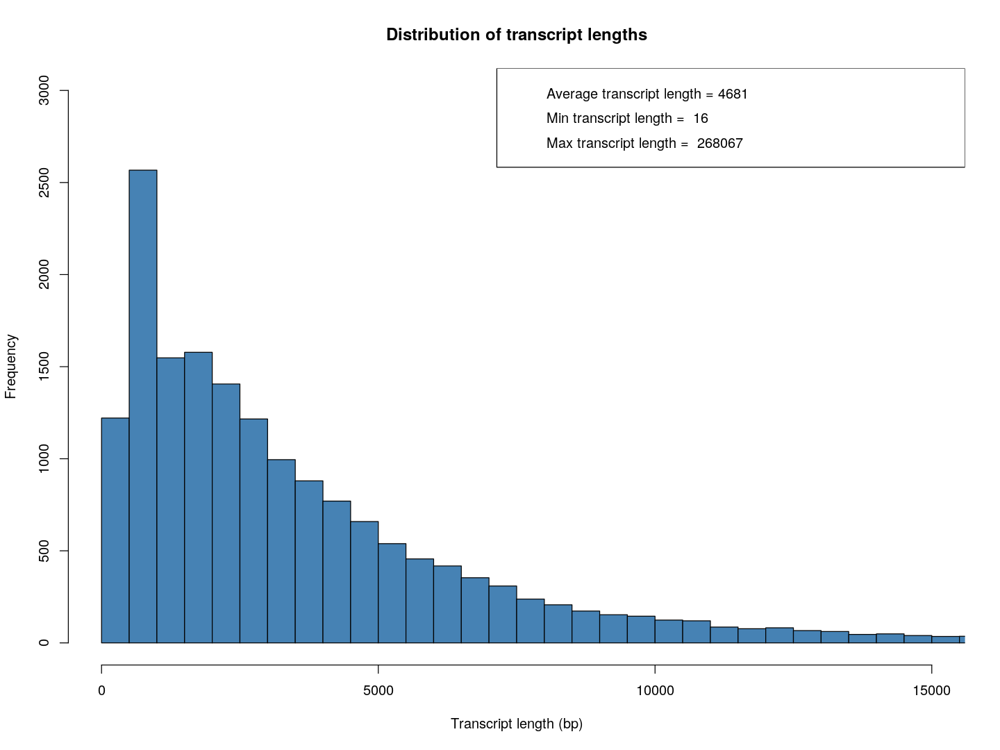

In [118]:
# plot transcripts lengths
options(repr.plot.width=12, repr.plot.height=9)
hist(tx_table$length, breaks=500, xlab="Transcript length (bp)", 
     main="Distribution of transcript lengths", 
     col="steelblue",
    xlim=c(0,15000),ylim=c(0,3000))
legend_text = c(paste("Average transcript length =", avg_length), paste("Min transcript length = ", min_length), paste("Max transcript length = ", max_length))
legend("topright", legend_text, cex = 1)
invisible(dev.print(png, "BALLGOWN_RES/BALLGOWN_tx_lengths.png", width=720, height=480))

In [36]:
# count the number of genes and count the number of transcripts per gene
counts=as.data.frame(table(transcript_gene_table[,"g_id"]))

In [37]:
length(rownames(counts))

[1] 75726

In [38]:
# filter out unexpressed genes
counts_pos <- counts %>% dplyr::filter(counts['Freq'] >= 1)

In [39]:
# transform first column as row.names
counts_pos <- data.frame(counts_pos, row.names = 1)

In [40]:
head(counts_pos)

,Freq
,<int>
ENSG00000000419.12,1
ENSG00000000938.13,3
ENSG00000001084.13,2
ENSG00000001167.14,1
ENSG00000001497.16,1
ENSG00000001561.7,1


In [41]:
# count genes with a unique transcript
c_one = length(which(counts_pos == 1))
c_one

[1] 5500

In [42]:
# genes with more than one transcript
c_more_than_one = length(which(counts_pos > 1))
c_more_than_one

[1] 3347

In [43]:
# maximum number of transcripts per gene
c_max = max(counts_pos)
c_max

[1] 214

In [44]:
# average number of transcripts per gene
avg_t = as.integer(mean(counts_pos[,'Freq']))
avg_t

[1] 1

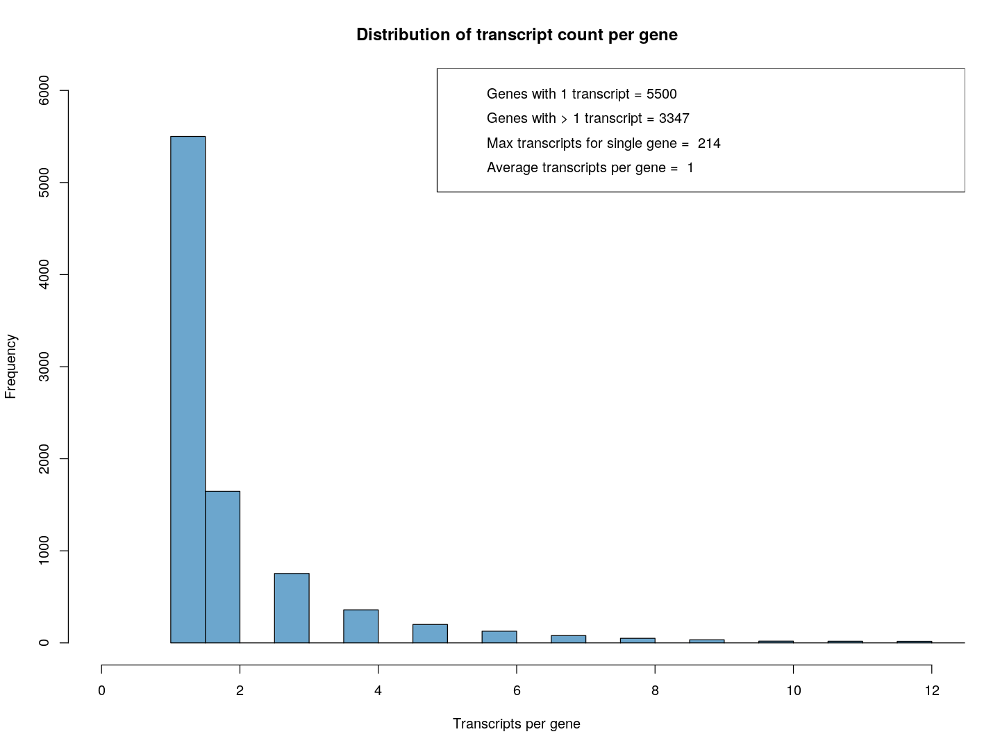

In [119]:
# plot transcripts per gene
options(repr.plot.width=12, repr.plot.height=9)
hist(counts_pos[,'Freq'], breaks=500, col='skyblue3', 
     xlab="Transcripts per gene", 
     main="Distribution of transcript count per gene", xlim=c(0,12),ylim=c(0,6000))
legend_text = c(paste("Genes with 1 transcript =", c_one), 
                paste("Genes with > 1 transcript =", c_more_than_one), 
                paste("Max transcripts for single gene = ", c_max),
               paste("Average transcripts per gene = ", avg_t))
legend("topright", legend_text, cex = 1)
invisible(dev.print(png, "BALLGOWN_RES/BALLGOWN_tx_counts.png", width=720, height=480))

In [48]:
# Pull the gene_expression data frame from the ballgown object
gene_expression = as.data.frame(gexpr(bg))
colnames(gene_expression) <- as.vector(metadata$sample)
dim(gene_expression)

[1] 8847   16

In [49]:
# compare with processed gene_expression in Python
dim(gene_expression_cur)

[1] 8847   20

#### Identify transcripts that show statistically significant differences between groups

In [54]:
results_transcripts = stattest(bg, feature="transcript", covariate="condition", getFC=TRUE, meas="FPKM")

In [55]:
# add mean values column
results_transcripts$mean <- rowMeans(texpr(bg))

In [56]:
# Add gene names and gene IDs to the results_transcripts data frame
results_transcripts = data.frame(geneNames=ballgown::geneNames(bg), geneIDs=ballgown::geneIDs(bg), results_transcripts)

In [57]:
head(results_transcripts)

,geneNames,geneIDs,feature,id,fc,pval,qval,mean
,<fct>,<fct>,<fct>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>
11,.,MSTRG.4,transcript,11,0.9773766,0.9162922,0.9933931,1.8806249
47,WASH9P,ENSG00000279457.4,transcript,47,1.0396206,0.9056651,0.9926147,1.9875114
49,MIR6859-2,ENSG00000273874.1,transcript,49,0.8803175,0.3631635,0.9599588,2.6705180
105,MTND1P23,ENSG00000225972.1,transcript,105,0.7096310,0.2711156,0.9599588,0.5064573
106,.,MSTRG.3,transcript,106,0.8045068,0.7675150,0.9784295,6.0574938
107,MTND2P28,ENSG00000225630.1,transcript,107,1.1469833,0.8293745,0.9829431,21.9152532


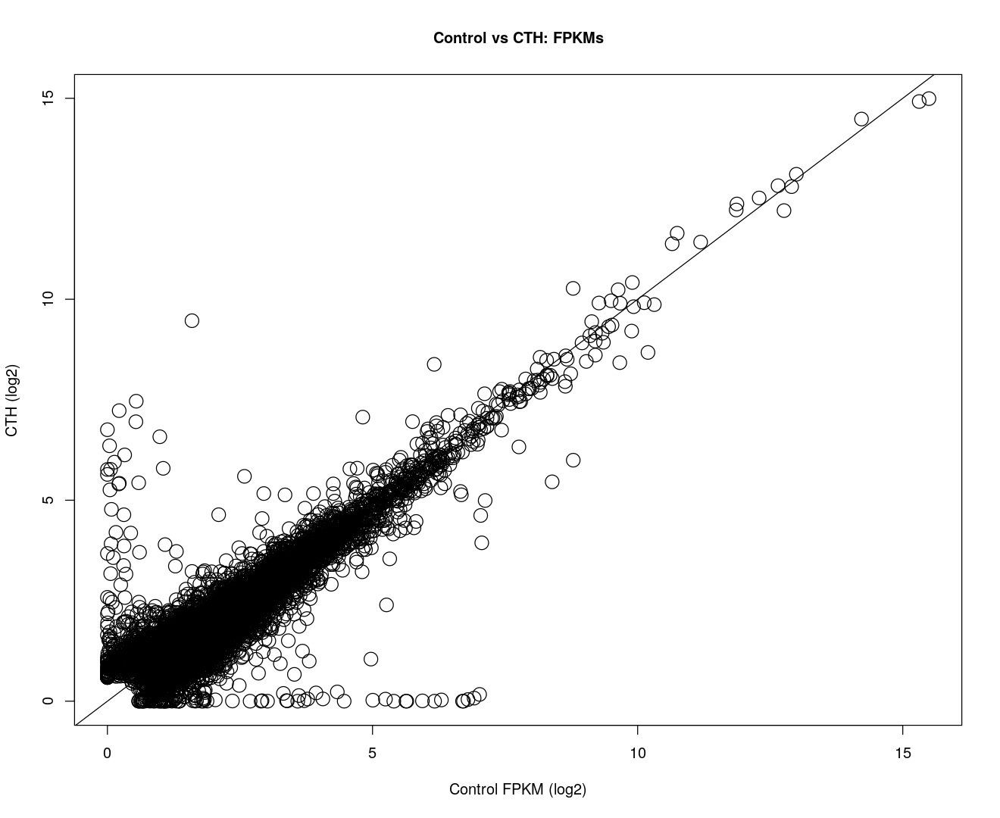

In [108]:
options(repr.plot.width=11, repr.plot.height=9)
plot(x=x, 
     y=y, 
     pch=1, 
     cex=2, 
     xlab="Control FPKM (log2)", 
     ylab="CTH (log2)", 
     main="Control vs CTH: FPKMs",
     cex.main=1,
     cex.axis=1,
     cex.lab=1)
abline(a=0, b=1)
invisible(dev.print(png, "BALLGOWN_RES/BALLGOWN_distrib_FPKM_CvsT.png", width=720, height=480))

In [58]:
# write table for Python processing
write.table(results_transcripts, "BALLGOWN_RES/bg_results_transcripts.txt", sep="\t")

In [59]:
# load filled table from Python
results_transcripts_cur <- read.table("BALLGOWN_RES/bg_results_transcripts_OK.txt", sep="\t", header=TRUE)

In [60]:
head(results_transcripts_cur)

geneNames,geneIDs,feature,id,fc,pval,qval,mean
<fct>,<fct>,<fct>,<int>,<dbl>,<dbl>,<dbl>,<dbl>
AL627309.3:MIR6859-1:AL627309.2:AL627309.6:MIR6859-2:WASH9P:AL627309.1:AL627309.7:AL627309.5:RNU6-1100P:FAM138A,MSTRG.4,transcript,11,0.9773766,0.9162922,0.9933931,1.8806249
WASH9P,ENSG00000279457.4,transcript,47,1.0396206,0.9056651,0.9926147,1.9875114
MIR6859-2,ENSG00000273874.1,transcript,49,0.8803175,0.3631635,0.9599588,2.6705180
MTND1P23,ENSG00000225972.1,transcript,105,0.7096310,0.2711156,0.9599588,0.5064573
MTND2P28,MSTRG.3,transcript,106,0.8045068,0.7675150,0.9784295,6.0574938
MTND2P28,ENSG00000225630.1,transcript,107,1.1469833,0.8293745,0.9829431,21.9152532


Warning message:
"Removed 2 rows containing missing values (geom_point)."


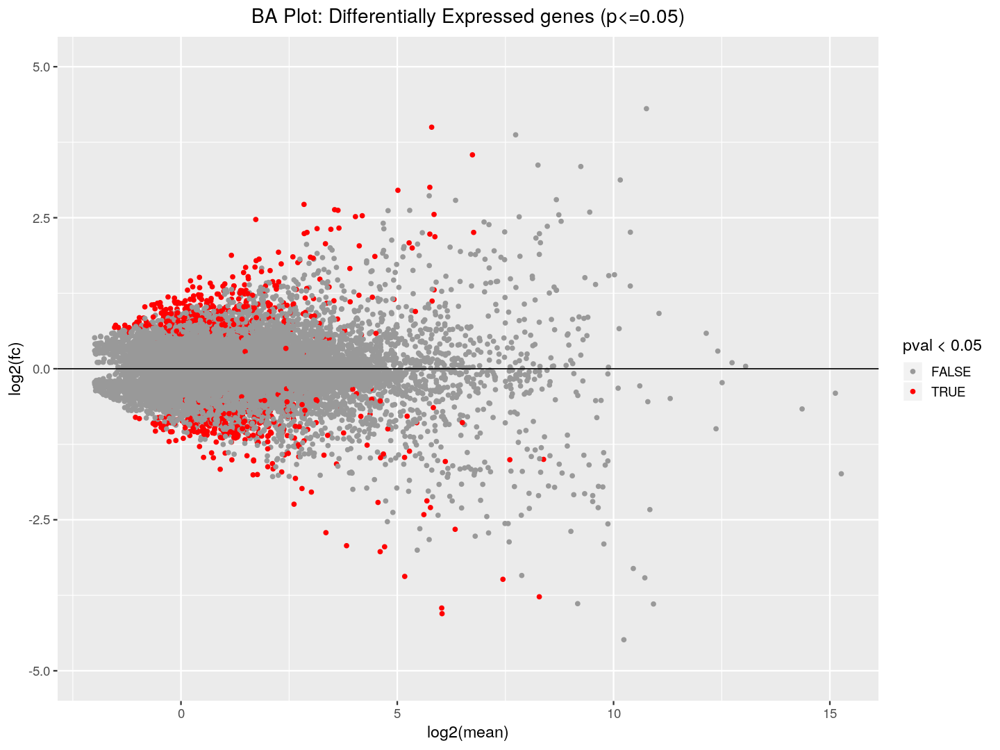

In [112]:
# Bland–Altman plot
# Differentially Expressed (DE) genes (p<=0.05) highlighted in red
options(repr.plot.width=12, repr.plot.height=9)
ggplot(results_transcripts_cur, aes(log2(mean), log2(fc), colour = pval<0.05)) +
scale_color_manual(values=c("#999999", "#FF0000")) +
geom_point() +
ylim(-5,5) +
geom_hline(yintercept=0) + 
theme_gray(base_size = 14) +
ggtitle("BA Plot: Differentially Expressed genes (p<=0.05)") +
theme(plot.title = element_text(hjust = 0.5))
invisible(dev.print(png, "BALLGOWN_RES/BALLGOWN_MAplot_p005.png", width=720, height=480))

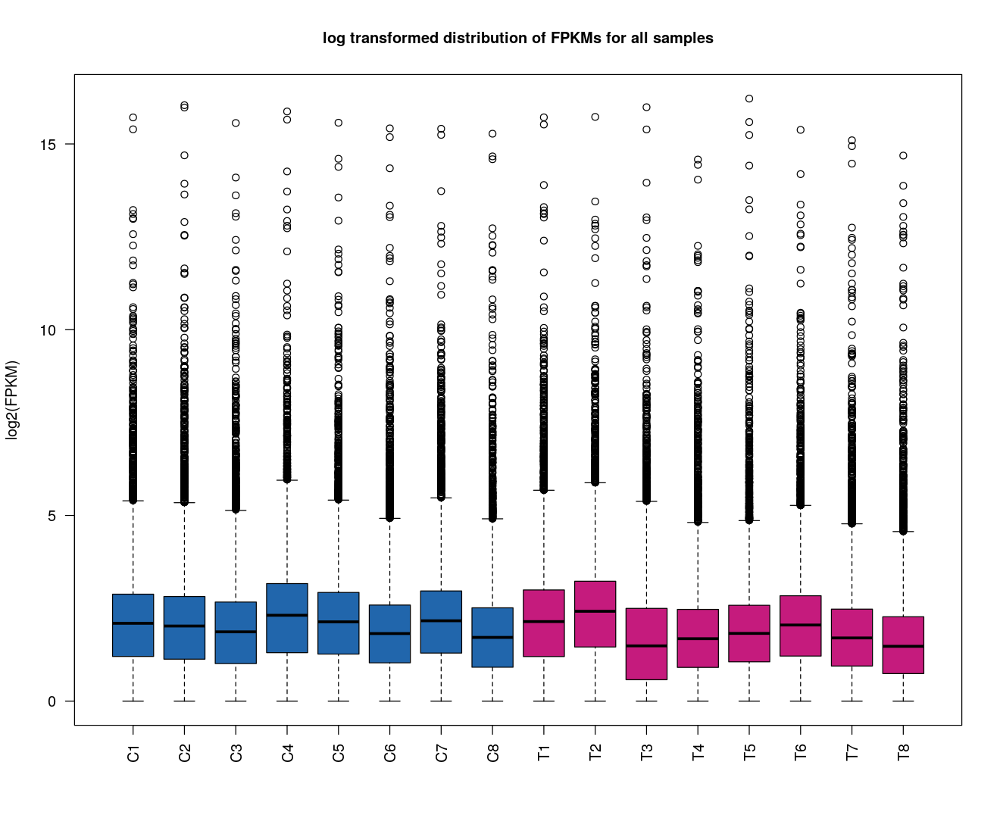

In [110]:
# differential gene expression
options(repr.plot.width=11, repr.plot.height=9)
gene_expression = gexpr(bg)
col <- rep(c(brewer.pal(8, "RdBu")[8], brewer.pal(8, "PiYG")[1]), each = 8)
boxplot(log2(gene_expression+1), 
        col=col, 
        las=2, 
        ylab="log2(FPKM)", 
        main="log transformed distribution of FPKMs for all samples", 
        names=c("C1","C2","C3","C4","C5","C6","C7","C8","T1","T2","T3","T4","T5","T6","T7","T8"),
        cex.main=1,
        cex.axis=1,
        cex.lab=1)
invisible(dev.print(png, "BALLGOWN_RES/BALLGOWN_LogTrans_boxplot.png", width=720, height=480))

In [70]:
head(gene_expression_cur)

geneIDs,geneNames,FPKM.BG01,FPKM.BG02,FPKM.BG03,FPKM.BG04,FPKM.BG05,FPKM.BG06,FPKM.BG07,FPKM.BG08,FPKM.BG09,FPKM.BG10,FPKM.BG11,FPKM.BG12,FPKM.BG13,FPKM.BG14,FPKM.BG15,FPKM.BG16,controlMeans,cthMeans
<fct>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000000419.12,DPM1,3.071421,2.308293,0.167408,0.558109,2.5905720,3.8269030,2.359116,3.349323,1.0324770,0.379715,5.43126200,1.7252210,4.404366,5.050120,0.921382,3.273753,2.278893,2.777287
ENSG00000000938.13,FGR,14.779531,24.619555,6.184224,25.636282,34.9014416,20.1699386,23.045040,18.480485,39.0909467,17.870318,6.33898942,3.9911566,5.079023,16.229340,15.831924,10.421323,20.977062,14.356628
ENSG00000001084.13,GCLC,1.140217,1.232682,1.711690,1.948833,0.9627277,0.6836224,1.750154,4.797488,0.5931038,5.229822,0.02001525,0.7865161,0.000000,2.847026,3.279366,2.021713,1.778427,1.847195
ENSG00000001167.14,NFYA,1.679026,1.580273,3.008221,5.118732,0.4591340,1.5431500,2.100641,1.451065,1.8212350,1.569821,1.76437500,2.5929380,3.985546,4.741767,4.485174,1.161270,2.117530,2.765266
ENSG00000001497.16,LAS1L,0.932872,1.918391,1.733324,3.588534,0.7349400,2.2963390,3.210236,2.252500,4.0251220,3.611774,3.89530200,0.7177480,0.678119,1.487848,2.199041,0.956867,2.083392,2.196478
ENSG00000001561.7,ENPP4,4.116619,3.666868,2.344814,3.300135,1.8345840,3.4213920,6.476027,3.598752,1.4734480,4.668679,3.21656800,1.6228680,1.599873,2.474864,3.069340,3.398120,3.594899,2.690470


In [71]:
# Average expression of Control samples Vs Average expression of CTH samples
# to avoid log 0, add 1 to log values. FPKM values are not normalized
x=log2(gene_expression_cur[,"controlMeans"]+1)
y=log2(gene_expression_cur[,"cthMeans"]+1)

In [120]:
# Log Fold Changes and store it in logfc column
results_genes_cur[,"logfc"] = log2(results_genes_cur[,"fc"])

In [121]:
# Identify the genes (rows) below p-value 0.05
sigpi = which(results_genes_cur[,"pval"]<0.05)

In [140]:
# Extract p-significant genes in a separate object
sigp = results_genes_cur[sigpi,]
length(sigp$geneNames)

[1] 399

In [131]:
head(sigp)

,geneNames,feature,id,fc,pval,qval,chr,strand,start,end,logfc
,<fct>,<fct>,<fct>,<dbl>,<dbl>,<dbl>,<fct>,<fct>,<int>,<int>,<dbl>
26,UPF1,gene,ENSG00000005007.12,0.5946166,0.01191121,0.9863857,19,+,18832001,18868229,-0.7499685
41,REX1BD,gene,ENSG00000006015.17,0.5656529,0.01344227,0.9863857,19,+,18588809,18592327,-0.8220110
53,ELAC2,gene,ENSG00000006744.19,0.7667809,0.04453604,0.9863857,17,-,12991612,13018027,-0.3831136
93,ALOX5,gene,ENSG00000012779.11,0.6089392,0.03822857,0.9863857,10,+,45442613,45443447,-0.7156299
102,CD6,gene,ENSG00000013725.14,0.5862831,0.04664666,0.9863857,11,+,60971680,61020377,-0.7703307
117,SERPINB1,gene,ENSG00000021355.13,1.8128506,0.02194694,0.9863857,6,-,2836108,2841848,0.8582600


In [132]:
# Identify the statistically significant DE genes 
sigde = which(abs(sigp[,"logfc"]) >= 1)

In [133]:
sigde

[1]   8  17  22  27  28  53  54  55  57  71  74  80  92  93  99 101 103 118 129
[20] 139 140 142 145 149 151 154 166 170 171 175 176 179 182 184 195 197 198 199
[39] 202 204 206 207 212 214 218 235 240 247 253 264 267 269 270 272 273 281 285
[58] 288 289 290 296 298 300 308 309 310 318 323 332 334 340 343 345 359 364 369
[77] 373 399

In [134]:
# Extract and store the statistically significant genes (rows) 
# that are upregulated/downregulated
sig_tn_de = sigp[sigde,]

In [135]:
head(sig_tn_de)

,geneNames,feature,id,fc,pval,qval,chr,strand,start,end,logfc
,<fct>,<fct>,<fct>,<dbl>,<dbl>,<dbl>,<fct>,<fct>,<int>,<int>,<dbl>
151,ATP6V0A1,gene,ENSG00000033627.16,2.2112819,0.035701234,0.9863857,17,+,42458844,42521485,1.144883
276,ABCA7,gene,ENSG00000064687.12,0.4502016,0.032491047,0.9863857,19,+,1042625,1065572,-1.151357
377,TP63,gene,ENSG00000073282.13,2.0545392,0.003960628,0.8745414,3,+,189631389,189897276,1.038815
506,EPS15,gene,ENSG00000085832.17,0.4962509,0.009254730,0.9800403,1,-,51354263,51519266,-1.010858
508,B4GALT1,gene,ENSG00000086062.12,2.1031220,0.032643917,0.9863857,9,-,33110637,33167356,1.072533
1074,GAB1,gene,ENSG00000109458.8,2.2164173,0.007243340,0.9154547,4,+,143336887,143469450,1.148230


In [128]:
# Order by p value, followed by differential expression
sorted_sig_tn_de = order(sig_tn_de[,"pval"], -abs(sig_tn_de[,"logfc"]), decreasing=FALSE)

In [129]:
# Extract the columns of interest:
# (gene id, fold change, log fold change, p-value and adjusted p-value) from the sorted list.
output = sig_tn_de[sorted_sig_tn_de,c("geneNames","id","fc","pval","qval","logfc")]
head(output)

,geneNames,id,fc,pval,qval,logfc
,<fct>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>
5785,NSD3,MSTRG.12816,0.4853685,0.0001407494,0.4922727,-1.042848
4745,MIR4648,ENSG00000264357.1,0.4572354,0.0001896164,0.4922727,-1.128991
7350,EFCAB14,MSTRG.472,3.5045571,0.0002275660,0.4922727,1.809232
7566,ROR1,MSTRG.552,0.4173369,0.0004652346,0.4922727,-1.260716
7775,ZNF415P1:RAB31,MSTRG.6226,5.2749924,0.0005485690,0.4922727,2.399169
4463,WASH8P,ENSG00000226210.3,2.0818258,0.0005564289,0.4922727,1.057849


In [148]:
# sorting unfiltered dataset
results_genes_cur_sorted = results_genes_cur[order(results_genes_cur$pval, decreasing=FALSE),]

In [149]:
head(results_genes_cur_sorted)

,geneNames,feature,id,fc,pval,qval,chr,strand,start,end,logfc
,<fct>,<fct>,<fct>,<dbl>,<dbl>,<dbl>,<fct>,<fct>,<int>,<int>,<dbl>
5785,NSD3,gene,MSTRG.12816,0.4853685,0.0001407494,0.4922727,8,-,38275828,38382240,-1.0428477
4745,MIR4648,gene,ENSG00000264357.1,0.4572354,0.0001896164,0.4922727,7,+,2527074,2527145,-1.1289909
7350,EFCAB14,gene,MSTRG.472,3.5045571,0.0002275660,0.4922727,1,-,46675115,46719135,1.8092321
6206,KI270867.1:-:141002:148537,gene,MSTRG.14313,1.9347579,0.0002685311,0.4922727,KI270867.1,-,141002,148537,0.9521530
8800,TIPARP,gene,MSTRG.9827,1.5855067,0.0004292168,0.4922727,3,+,156674599,156706751,0.6649439
7566,ROR1,gene,MSTRG.552,0.4173369,0.0004652346,0.4922727,1,+,63774761,64181762,-1.2607156


In [151]:
# save full results
write.table(results_genes_cur_sorted, file="BALLGOWN_RES/BALLGOWN_results_FPKM.txt", sep="\t", row.names=FALSE, quote=FALSE)

#### Visualize gene expression

In [160]:
# Find a gene ID with Name
results_genes_cur[which(results_genes_cur$geneNames == "NSD3"), ]

,geneNames,feature,id,fc,pval,qval,chr,strand,start,end,logfc
,<fct>,<fct>,<fct>,<dbl>,<dbl>,<dbl>,<fct>,<fct>,<int>,<int>,<dbl>
2531,NSD3,gene,ENSG00000147548.17,0.8123816,0.3359709547,0.9863857,8,-,38348127,38380821,-0.2997705
5785,NSD3,gene,MSTRG.12816,0.4853685,0.0001407494,0.4922727,8,-,38275828,38382240,-1.0428477


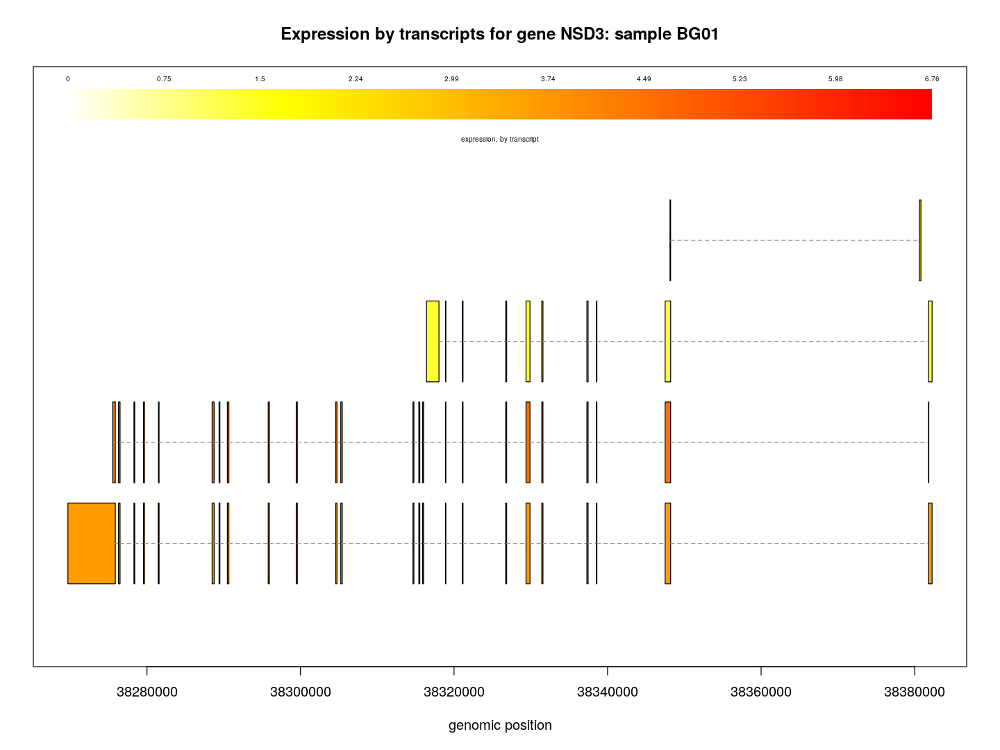

In [161]:
# plotTranscripts for a gene, for 1 sample
options(repr.plot.width=12, repr.plot.height=9)
#jpeg("BALLGOWN_RES/bg_expr_gene_CD53_RNA01.jpg")
plotTranscripts(gene='ENSG00000147548.17', 
                bg, 
                samples='BG01', 
                # meas='FPKM', 
                colorby='transcript', 
                main='Expression by transcripts for gene NSD3: sample BG01',
                blackBorders=TRUE)
invisible(dev.print(png, "BALLGOWN_RES/BALLGOWN_expr_gene_NSD3_BG01.png", width=720, height=480))

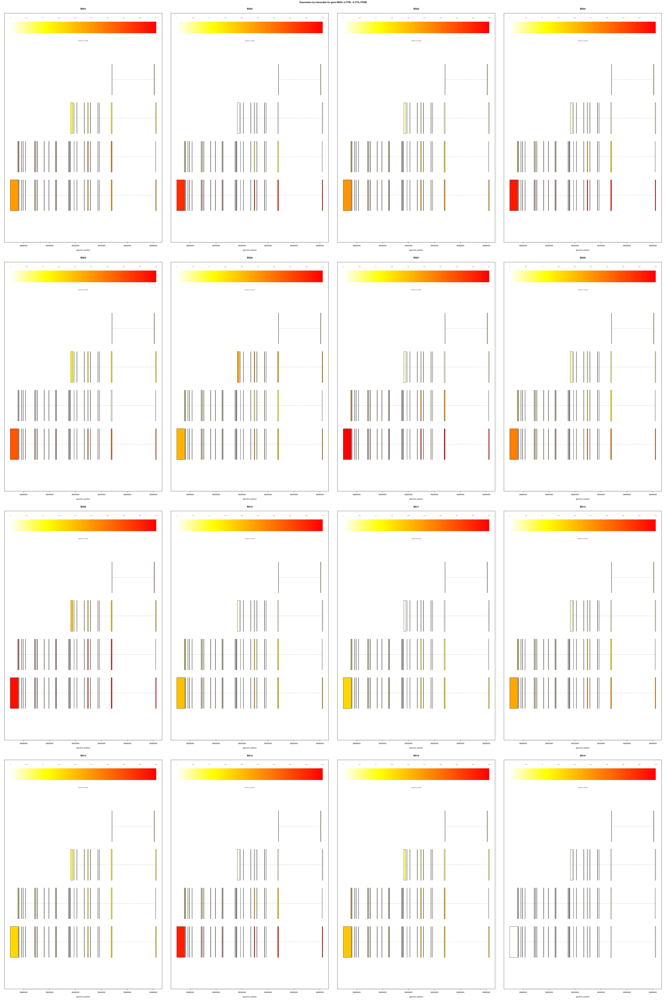

In [165]:
options(repr.plot.width=40, repr.plot.height=60)
plotTranscripts('ENSG00000147548.17', 
                bg, 
                samples=c('BG01','BG02','BG03','BG04','BG05','BG06','BG07','BG08',
                          'BG09', 'BG10', 'BG11','BG12','BG13','BG14','BG15','BG16'), 
                meas='FPKM', 
                colorby='transcript', 
                main='Expression by transcripts for gene NSD3: 8 CTRL / 8 CTH, FPKM')
invisible(dev.print(png, "BALLGOWN_RES/BALLGOWN_expr_gene_NSD3_AllSamples.png", width=680, height=960))

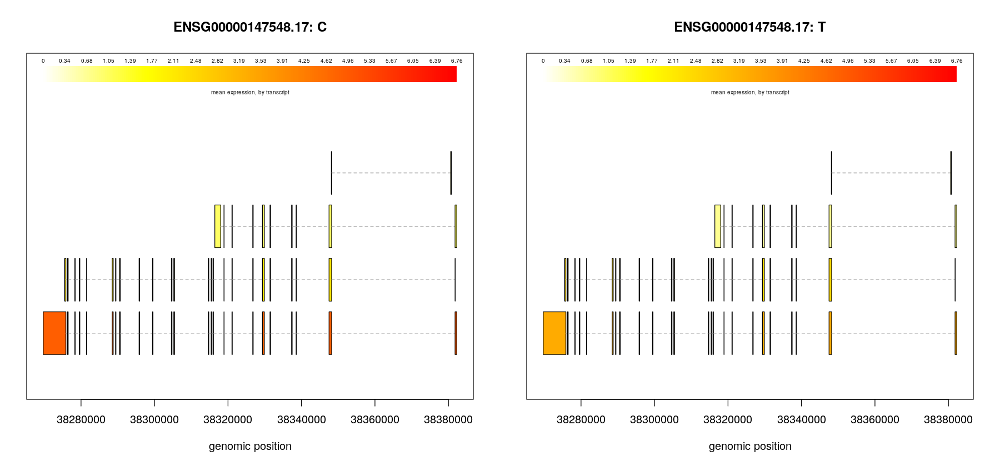

In [168]:
# plot transcript means for all the samples
options(repr.plot.width=15, repr.plot.height=7)
plotMeans('ENSG00000147548.17', 
          bg, 
          groupvar='condition', 
          meas='FPKM', 
          colorby='transcript')
invisible(dev.print(png, "BALLGOWN_RES/BALLGOWN_expr_gene_NSD3_Means.png", width=720, height=480))

In [169]:
# retrieve gene expression as dataframe
gene_expression_cur=as.data.frame(gene_expression_cur)

In [170]:
# re-create a new gene_expression object without transofrmation for reference of PCA plot
gene_expression = gexpr(bg)
gene_expression=as.data.frame(gene_expression)

In [171]:
names(gene_expression)

[1] "FPKM.BG01" "FPKM.BG02" "FPKM.BG03" "FPKM.BG04" "FPKM.BG05" "FPKM.BG06"
 [7] "FPKM.BG07" "FPKM.BG08" "FPKM.BG09" "FPKM.BG10" "FPKM.BG11" "FPKM.BG12"
[13] "FPKM.BG13" "FPKM.BG14" "FPKM.BG15" "FPKM.BG16"

In [172]:
metadata = read.csv("REF/experiment_data.csv")

In [176]:
# Extract gene expression values using significant genes
sig_gene_expression=gene_expression[rownames(gene_expression) %in% sigp$id,]

In [177]:
# change the row names to match the plot
rownames(metadata)=metadata[,1]
colnames(sig_gene_expression)=row.names(metadata)

### Draw PCA plot

In [178]:
head(sig_gene_expression)

,RNA01,RNA02,RNA03,RNA04,RNA05,RNA06,RNA07,RNA08,RNA09,RNA10,RNA11,RNA12,RNA13,RNA14,RNA15,RNA16
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000005007.12,2.883541,3.063790,1.8590100,7.039737,2.098473,3.244020,3.570597,1.410708,0.872480,1.477483,2.131964,0.390791,1.585252,0.674857,2.136977,1.293851
ENSG00000006015.17,1.602498,4.083997,2.1209820,1.671093,3.349805,2.071764,3.269404,0.634446,0.000000,0.000000,1.791709,1.092352,1.626707,1.343544,1.359924,1.552947
ENSG00000006744.19,4.021230,3.208335,4.0422110,3.943151,4.694814,2.921443,3.235353,1.998409,2.421354,2.669282,2.224566,0.886339,2.296509,3.625571,2.827996,0.822238
ENSG00000012779.11,44.122876,68.269651,57.8021246,25.240554,51.669163,27.334872,38.150061,35.343703,50.651763,24.557637,8.241877,18.510075,18.966650,25.372344,26.364685,27.945128
ENSG00000013725.14,0.888026,0.479787,4.1377510,0.926098,1.873990,0.787002,0.622884,3.287152,0.000000,0.823963,0.000000,0.000000,2.097725,0.000000,1.140888,0.702145
ENSG00000021355.13,3.820528,6.949831,0.8015532,2.751708,10.628078,4.254063,1.975090,2.806305,11.711467,8.084934,6.106780,6.026989,5.283139,5.792547,6.060880,5.410381


In [179]:
# transpose the data and compute principal components
pca_data=prcomp(t(sig_gene_expression))

In [180]:
# Calculate PCA component percentages
pca_data_perc=round(100*pca_data$sdev^2/sum(pca_data$sdev^2),1)

In [181]:
# Extract 1 and 2 principle components,
# create a data frame with sample names,
# first and second principal components and group information
df_pca_data = data.frame(PC1 = pca_data$x[,1], 
                         PC2 = pca_data$x[,2], 
                         sample = colnames(sig_gene_expression), 
                         condition = rep(c("C","T"),
                                         each=8))

In [182]:
head(df_pca_data)

,PC1,PC2,sample,condition
,<dbl>,<dbl>,<fct>,<fct>
RNA01,-337.32853,-908.6365,RNA01,C
RNA02,-185.70999,-449.3060,RNA02,C
RNA03,-298.22604,-411.8146,RNA03,C
RNA04,49.43587,-823.9594,RNA04,C
RNA05,-260.80054,-178.7936,RNA05,C
RNA06,-756.20136,736.5690,RNA06,C


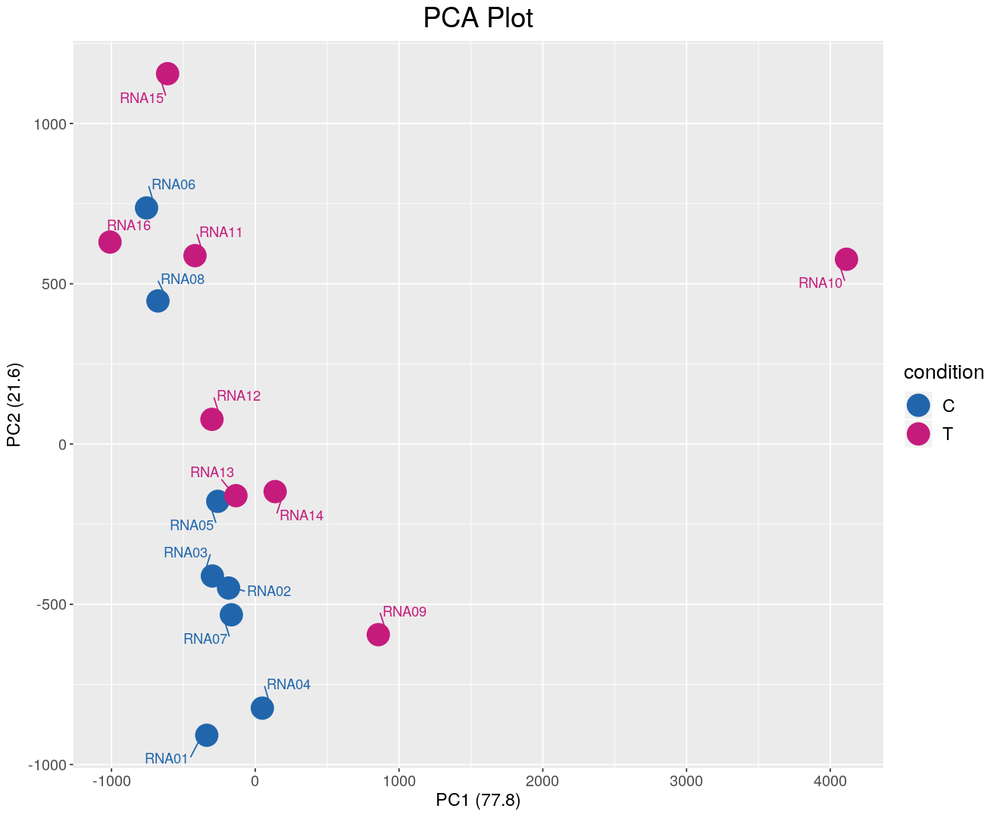

In [183]:
# Plot PCA per sample
options(repr.plot.width=11, repr.plot.height=9)
ggplot(df_pca_data, aes(PC1,PC2, color = condition))+
geom_point(size=8)+
ggtitle("PCA Plot") + 
theme(plot.title = element_text(hjust = 0.5, size=22), 
      axis.text=element_text(size=12),
      axis.title=element_text(size=14), 
      legend.text=element_text(size=14),
      legend.title=element_text(size=16),
      legend.position="right") + 
labs(x=paste0("PC1 (",pca_data_perc[1],")"), y=paste0("PC2 (",pca_data_perc[2],")"))+
geom_text_repel(aes(label=sample),point.padding = 0.75) +
scale_colour_manual(values = c(brewer.pal(8, "RdBu")[8], brewer.pal(8, "PiYG")[1]))
ggsave("BALLGOWN_RES/BALLGOWN_stringtie_PCA.png", width=11, height=9)
invisible(dev.off())

## LIMMA

In [253]:
# Function that replace the accession numbers by the genes names in the dataset
# also filters out unrecognized genes
getMatrixWithSymbolsLimma <- function(dds){
require("AnnotationDbi")
require("org.Hs.eg.db")
 
geneSymbols <- mapIds(org.Hs.eg.db, keys=rownames(dds), column="SYMBOL", keytype="ENSEMBL", multiVals="first")
 
# get the ensembl ids with gene symbols i.e. remove those with NA's for gene symbols
inds <- which(!is.na(geneSymbols))
found_genes <- geneSymbols#[inds]
 
# subset data frame based on the found_genes
dds2 <- dds[names(found_genes), ]
gene_frame = data.frame(ENSEMBL=rownames(dds2), SYMBOL=as.vector(found_genes))
#gene_frame <- gene_frame[!duplicated(gene_frame$ENSEMBL),]
#gene_frame <- gene_frame[!duplicated(gene_frame$SYMBOL),]
dds2$genes <- gene_frame
return(dds2)
}

In [254]:
# Function that replace the accession numbers by the genes names in the dataset
# also filters out unrecognized genes
getMatrixWithSymbolsSimple <- function(dds){
require("AnnotationDbi")
require("org.Hs.eg.db")
 
geneSymbols <- mapIds(org.Hs.eg.db, keys=rownames(dds), column="SYMBOL", keytype="ENSEMBL", multiVals="first")
 
# get the ensembl ids with gene symbols i.e. remove those with NA's for gene symbols
inds <- which(!is.na(geneSymbols))
found_genes <- geneSymbols#[inds]
 
# subset your data frame based on the found_genes
dds2 <- dds[names(found_genes), ]
rownames(dds2) <- as.vector(found_genes)
return(dds2)
}

In [208]:
# function to store heatmaps as png
save_pheatmap_png <- function(x, filename, width=580, height=480) {
   stopifnot(!missing(x))
   stopifnot(!missing(filename))
   png(filename, width=width, height=height)
   grid::grid.newpage()
   grid::grid.draw(x$gtable)
   invisible(dev.off())
}

In [362]:
GeneMatStringtie <- as.matrix(read.csv("STRINGTIE_MERGE/gene_count_matrix.csv", row.names="gene_id"))
# Filter out transcripts with a variance across samples less than one
GeneMatStringtie = subset(GeneMatStringtie, rowVars(GeneMatStringtie) > 1)
length(rownames(GeneMatStringtie))

[1] 44314

In [364]:
# remove all MSTRG IDs
GeneMatStringtie = subset(GeneMatStringtie, 
                          grepl("MSTRG", rownames(GeneMatStringtie), fixed=TRUE) == FALSE)
length(rownames(GeneMatStringtie))

[1] 29479

In [365]:
condition = factor(rep(c('C','T'), each = 8))

In [366]:
# create a DGEList object from data matrix
dge <- DGEList(counts=GeneMatStringtie,
              lib.size = colSums(GeneMatStringtie),
              norm.factors = calcNormFactors(GeneMatStringtie),
              samples = colnames(GeneMatStringtie),
              group=condition,
              genes = NULL,
              remove.zeros = FALSE)

In [367]:
# retrieve rownames in list
geneid_list = rownames(dge)
# strip the decimal if ENSEMBL ID (leave stringtie MTSRG with decimals)
for (i in 1:length(geneid_list)) {
    if (grepl("ENS", geneid_list[i], fixed=TRUE)){
        geneid_list[i] <- vapply(strsplit(geneid_list[i], ".", fixed = TRUE), "[", "", 1)
    }
}
# replace dataset rownames
rownames(dge) <- geneid_list
# remove duplicates if any
dge <- dge[!duplicated(rownames(dge)),]
# add all possible gene symbols with mapIds()
dge = getMatrixWithSymbolsLimma(dge)
length(rownames(dge$counts))

'select()' returned 1:many mapping between keys and columns



[1] 29448

In [368]:
# export gene IDs for processing in Python to get symbols with Pyensembl
write.table(dge$genes, file="LIMMA_RES/limma_stringtie_geneids.txt", sep="\t", row.names=FALSE)

In [369]:
# retrieve list from Python
geneid_list <- read.table("LIMMA_RES/limma_stringtie_geneids_OK.txt", sep="\t", header=TRUE)
length(geneid_list$SYMBOL)

[1] 29448

In [370]:
# replace dge$genes$SYMBOL list with new one
dge$genes$SYMBOL <- geneid_list$SYMBOL
head(dge)

An object of class "DGEList"
$counts
                BG01 BG02 BG03 BG04 BG05 BG06 BG07 BG08 BG09 BG10 BG11 BG12
ENSG00000280143  206   98  292  218   69   85  101  262  310  106   28   53
ENSG00000146083  155  107  144  250  326  452  107  194  137  122   50   94
ENSG00000269416 1371   55    0   86  729 1098  701  962    3    3   57   17
ENSG00000231981    4    0    0   33   20    0   13    9    6    8    0   10
ENSG00000134108 1182 1430 1498 4721 1679 1622 3063 1425 2239 2718 2148 1825
ENSG00000198242 1519 2846 2920 3440 2099 2795 3852 1884 3126 3284 1079 1830
                BG13 BG14 BG15 BG16
ENSG00000280143  158  101  218  240
ENSG00000146083  456  380  165  245
ENSG00000269416  539    0 1531  331
ENSG00000231981    5    3    2    0
ENSG00000134108 1498 2027 1746  838
ENSG00000198242 9668 2369 1825 1249

$samples
     group lib.size norm.factors samples
BG01     C 32747816    1.0447883    BG01
BG02     C 40349843    0.8409486    BG02
BG03     C 24228752    1.2565454    BG03
BG04     C 41637086    0.9618039    BG04
BG05     C 30437438    1.0989701    BG05
11 more rows ...

$genes
          ENSEMBL     SYMBOL
1 ENSG00000280143 AP000892.4
2 ENSG00000146083      RNF44
3 ENSG00000269416  LINC01224
4 ENSG00000231981  RPL7L1P12
5 ENSG00000134108      ARL8B
6 ENSG00000198242     RPL23A

In [371]:
# Design and Contrast
condition = factor(rep(c('C','T'), each = 8))
design <- model.matrix(~0+condition)
colnames(design) <- c("C","T")
contrast <- makeContrasts(C,T,T-C, levels = design)

In [372]:
# counts are converted to logCPM values using edgeR
# --> damp down the variances of logarithms of low counts
cpm <- cpm(dge, prior.count=5)
lcpm <- cpm(dge, log=TRUE)

In [373]:
# calculate mean and median of library size
L <- mean(dge$samples$lib.size) * 1e-6
M <- median(dge$samples$lib.size) * 1e-6
c(L, M)

[1] 33.37481 31.81327

In [374]:
# number of genes that are not expressed or insiginificantly
table(rowSums(dge$counts==0)==length(colnames(dge)))


FALSE 
29448 

In [375]:
# edgeR filtering, keeping as many genes as possible with worthwhile counts
keep <- filterByExpr(dge, group=design)
dge <- dge[keep,]
dim(dge)

[1] 13356    16

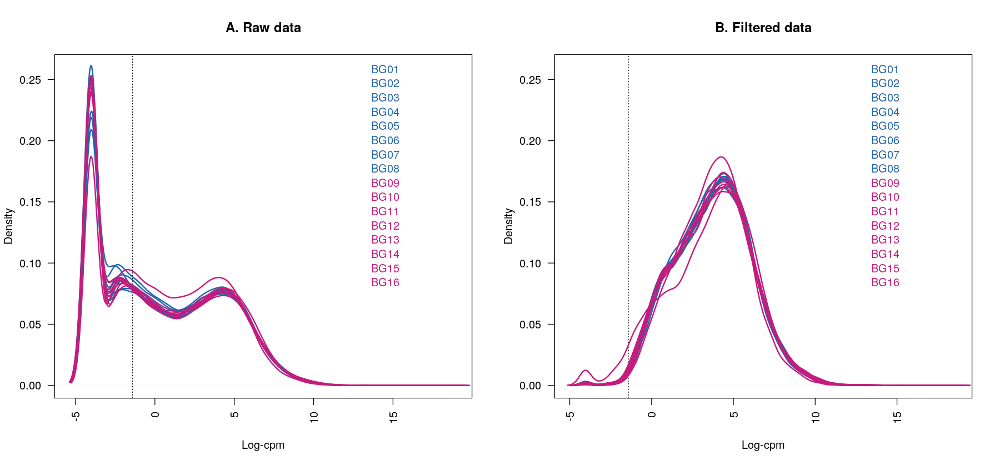

In [376]:
# density of log-CPM values for raw pre-filtered data (A) and post-filtered data (B) 
# Dotted vertical lines mark the log-CPM threshold
options(repr.plot.width=15, repr.plot.height=7)
lcpm.cutoff <- log2(10/M + 2/L)
samplenames <- colnames(dge)
nsamples <- ncol(dge)
col <- rep(c(brewer.pal(8, "RdBu")[8], brewer.pal(8, "PiYG")[1]), each = 8)
par(mfrow=c(1,2))

plot(density(lcpm[,1]), col=col[1], lwd=2, ylim=c(0,0.26), las=2, main="", xlab="")
title(main="A. Raw data", xlab="Log-cpm")
abline(v=lcpm.cutoff, lty=3)
for (i in 2:nsamples){
    den <- density(lcpm[,i])
    lines(den$x, den$y, col=col[i], lwd=2)
}
legend("topright", samplenames, text.col=col, bty="n")

lcpm <- cpm(dge, log=TRUE)
plot(density(lcpm[,1]), col=col[1], lwd=2, ylim=c(0,0.26), las=2, main="", xlab="")
title(main="B. Filtered data", xlab="Log-cpm")
abline(v=lcpm.cutoff, lty=3)
for (i in 2:nsamples){
    den <- density(lcpm[,i])
    lines(den$x, den$y, col=col[i], lwd=2)
}
legend("topright", samplenames, text.col=col, bty="n")
invisible(dev.print(png, "LIMMA_RES/LIMMA_stringtie_rawVSedgeR.png", width=960, height=480))

In [377]:
# edgeR normalization
# option: "TMM","TMMwsp","RLE","upperquartile","none"
# RLE: relative log expression
# TMM: normalisation by trimmed mean of M-values
# scaling factors closer to 1 --> milder TMM-normalisation effect
dge <- calcNormFactors(dge, method = "TMM")
dge$samples$norm.factors

[1] 1.0337082 0.8353379 1.2569442 0.9553588 1.1265867 0.8944838 1.0117013
 [8] 0.9254496 0.8915013 1.0902829 0.8556428 1.0558830 0.8181511 1.3272369
[15] 0.9750230 1.0993827

In [378]:
# duplicate dataset and adjust to see differences before/after normalization
dge2 <- dge
dge2$samples$norm.factors <- 1
dge2$counts[,1] <- ceiling(dge2$counts[,1]*0.05)
dge2$counts[,2] <- dge2$counts[,2]*5

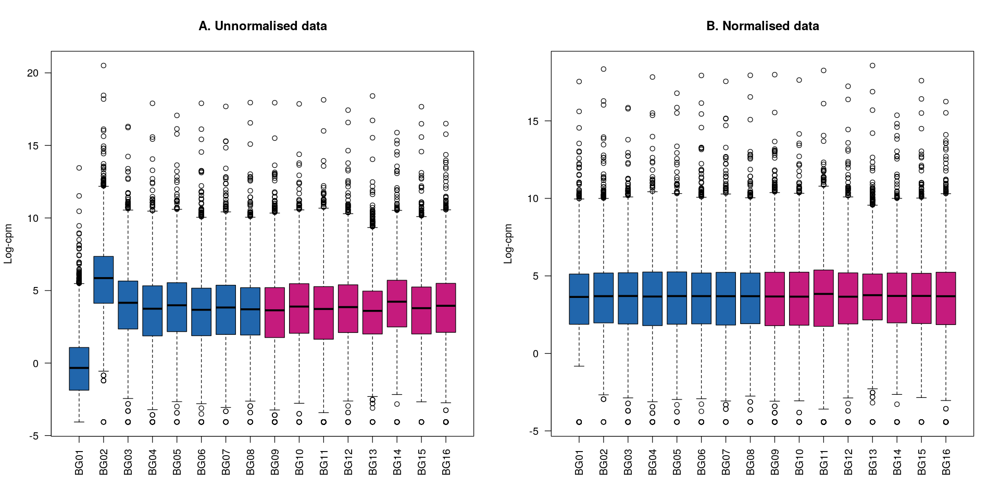

In [379]:
# expression distribution of samples for unnormalised and normalised data
#png("LIMMA_RES/ebseq_FCvsPFC_gene_expr.png")
options(repr.plot.width=16, repr.plot.height=8)
par(mfrow=c(1,2))
col <- rep(c(brewer.pal(8, "RdBu")[8], brewer.pal(8, "PiYG")[1]), each = 8)

lcpm <- cpm(dge2, log=TRUE)
boxplot(lcpm, las=2, col=col, main="")
title(main="A. Unnormalised data",ylab="Log-cpm")

dge2 <- calcNormFactors(dge2)
lcpm <- cpm(dge2, log=TRUE)
boxplot(lcpm, las=2, col=col, main="")
title(main="B. Normalised data",ylab="Log-cpm")

invisible(dev.print(png, "LIMMA_RES/LIMMA_stringtie_rawVSnorm.png", width=960, height=480))

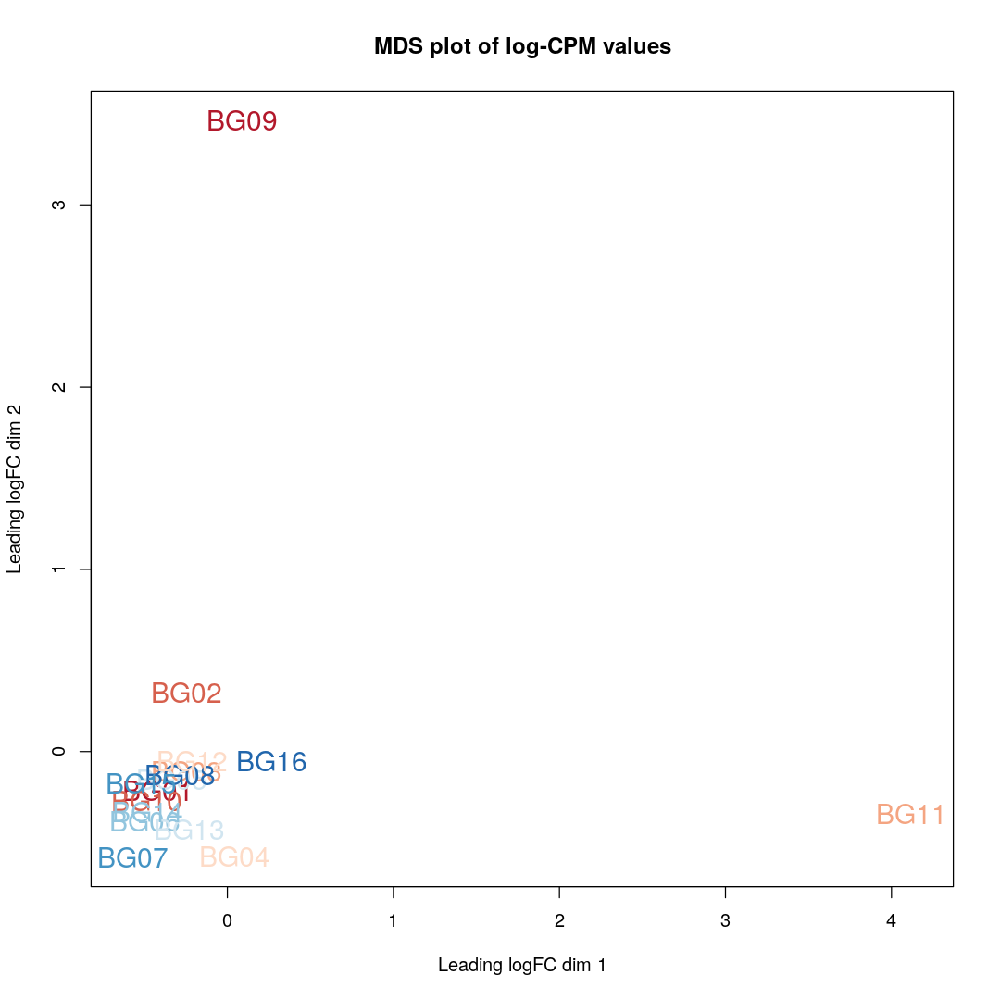

In [380]:
# LogCPM : log counts per million (expression level)
# LogFC : log fold-change (log difference between conditions)
# MDS plot of log-CPM values over dimensions 1 and 2 with samples coloured and labeled by sample
# MDS = multi-dimensional scaling
# dim1 : leading-fold-change that best separates samples and explains the largest proportion of variation in the data
options(repr.plot.width=9, repr.plot.height=9)
col <- rep(c(brewer.pal(8, "RdBu")[8], brewer.pal(8, "PiYG")[1]), each = 8)

lcpm <- cpm(dge, log=TRUE)
#ylim=c(-0.6,1), xlim=c(-0.5,0.8)
col.group <- design
col.group <- as.character(col.group)
plotMDS(lcpm, labels=rownames(dge$samples), col=brewer.pal(n=8, name = "RdBu"), cex=1.5)
title(main="MDS plot of log-CPM values")
invisible(dev.print(png, "LIMMA_RES/LIMMA_stringtie_MDS_log-CPM.png", width=480, height=480))

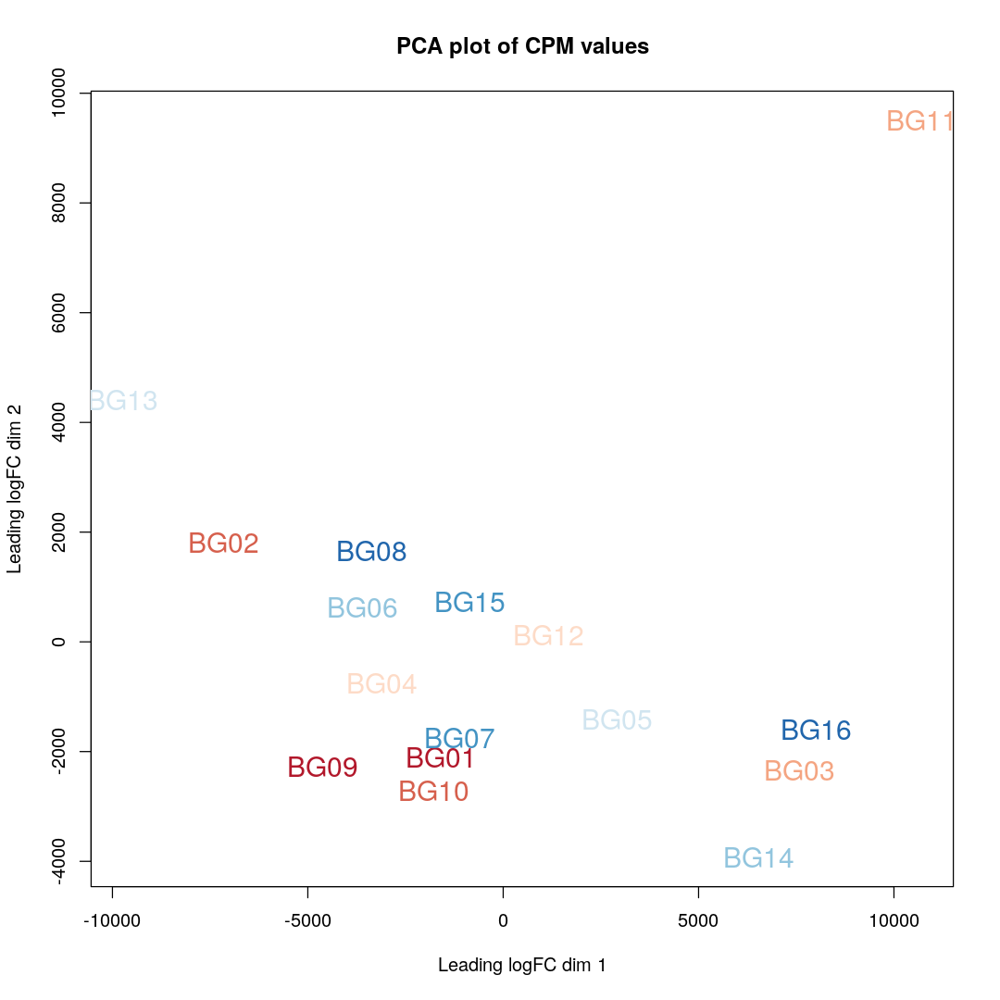

In [381]:
# PCA plot with CPM values over dimensions 1 and 2 with samples coloured and labeled by sample
options(repr.plot.width=9, repr.plot.height=9)
col <- rep(c(brewer.pal(8, "RdBu")[8], brewer.pal(8, "PiYG")[1]), each = 8)

cpm <- cpm(dge)
#xlim=c(-6000,10000),ylim=c(-3500,2000)
col.group <- design
col.group <- as.character(col.group)
plotMDS(cpm, 
        labels=rownames(dge$samples), 
        col=brewer.pal(n=8, name = "RdBu"), 
        cex=1.5)
title(main="PCA plot of CPM values")
invisible(dev.print(png, "LIMMA_RES/LIMMA_stringtie_PCA_CPM.png", width=480, height=480))

## B) Differential Expression Analysis

In [343]:
# for RNA-seq count data, the variance is not independent of the mean,
# this is true of raw counts or when transformed to log-CPM values
# --> voom converts raw counts to log-CPM values by automatically extracting library sizes 
# and normalisation factors.
# the voom-plot provides a visual check on the level of filtering performed upstream.

In [344]:
# 1) counts are transformed to log2 counts per million reads (CPM)
# 2) linear model is fitted to the log2 CPM for each gene, residuals are calculated
# 3) smoothed curve is fitted to the sqrt(residual standard deviation) by average expression
# 4) moothed curve is used to obtain weights for each gene and sample
# --> problem if the curve points downward in extremes
# --> should be open "U" shape

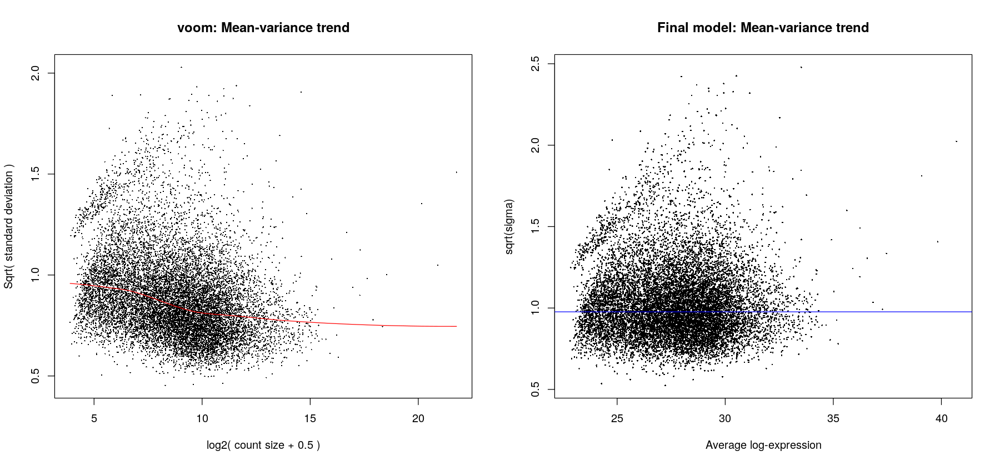

In [382]:
# Means (x-axis) and variances (y-axis) of each gene are plotted to show the dependence
# before voom is applied to the data (left panel) 
# and how the trend is removed after voom precision weights are applied to the data
# LEFT: residual variances from fitting linear models to log-CPM transformed data
# RIGHT: log2 residual standard deviations against mean log-CPM values
options(repr.plot.width=15, repr.plot.height=7)
par(mfrow=c(1,2))
v <- voom(dge, design, plot=TRUE, lib.size=TRUE)
# lmFit fits a linear model using weighted least squares for each gene
vfit <- lmFit(v)
# contrast between conditions (log fold-changes)
vfit <- contrasts.fit(vfit, contrasts=contrast)
# Empirical Bayes smoothing of standard errors
# shrinks standard errors that are much larger or smaller 
# than those from other genes towards the average standard error
efit <- eBayes(vfit)
plotSA(efit, main="Final model: Mean-variance trend")
invisible(dev.print(png, "LIMMA_RES/LIMMA_stringtie_voom.png", width=960, height=480))

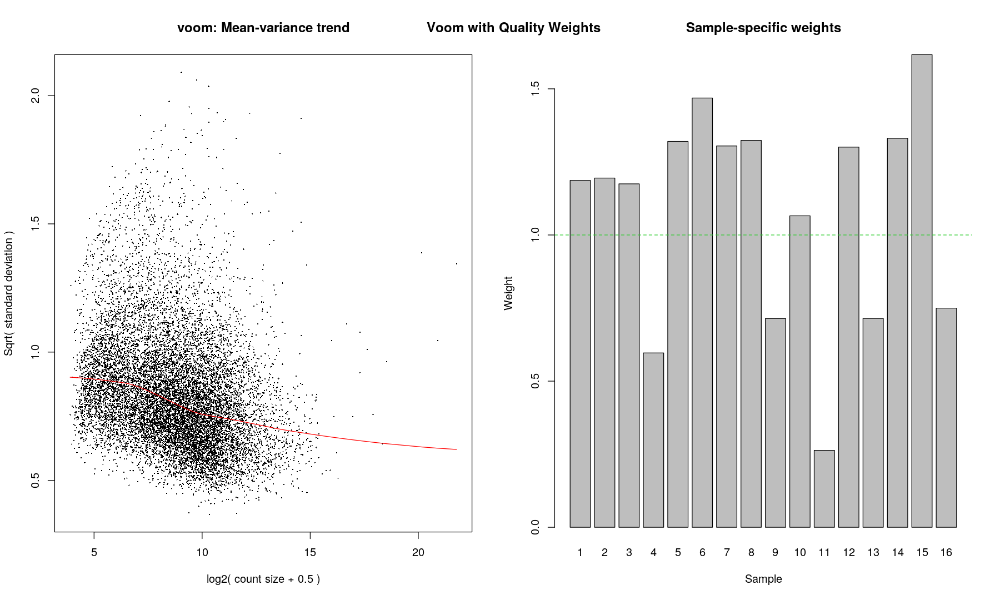

In [383]:
# Voom with Quality weights
options(repr.plot.width=15, repr.plot.height=9)
vv <- voomWithQualityWeights(dge, design, plot = TRUE)
title(main="Voom with Quality Weights")
invisible(dev.print(png, 
                    "LIMMA_RES/LIMMA_stringtie_voomQualityWeights.png", 
                    width=960, 
                    height=480))

In [384]:
# After fitting a linear model, the standard errors are moderated using a simple empirical Bayes model
# top DE genes
treat_efit <- treat(vfit,lfc=0.1)
top_treat_efit <- topTreat(treat_efit,coef=3, sort.by = "P", n = Inf)
head(top_treat_efit)

,ENSEMBL,SYMBOL,logFC,AveExpr,t,P.Value,adj.P.Val
,<fct>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000153339,ENSG00000153339,TRAPPC8,-1.835146,28.49919,-4.960559,5.878417e-05,0.5048825
ENSG00000279561,ENSG00000279561,AL845472.2,1.722746,25.27812,4.841174,7.560385e-05,0.5048825
ENSG00000108797,ENSG00000108797,CNTNAP1,-1.816850,27.21545,-4.641501,1.210012e-04,0.5386975
ENSG00000111424,ENSG00000111424,VDR,2.488096,25.03042,4.460511,2.000453e-04,0.6679511
ENSG00000272325,ENSG00000272325,NUDT3,-1.788752,31.38853,-3.776171,8.940898e-04,0.8802260
ENSG00000264522,ENSG00000264522,OTUD7B,1.277040,26.73683,3.720498,9.218315e-04,0.8802260


In [385]:
# Export results
write.table(top_treat_efit, 
            file = "LIMMA_RES/LIMMA_stringtie_results_topTreat_efit.txt", 
            row.names = F, 
            sep = "\t", 
            quote = F)

In [386]:
head(efit$genes$SYMBOL)

[1] AP000892.4 RNF44      ARL8B      RPL23A     AL732366.2 RAB4B     
29106 Levels: 7SK A1BG A1BG-AS1 A2M A2M-AS1 A2ML1 A2ML1-AS1 A2ML1-AS2 ... ZZZ3

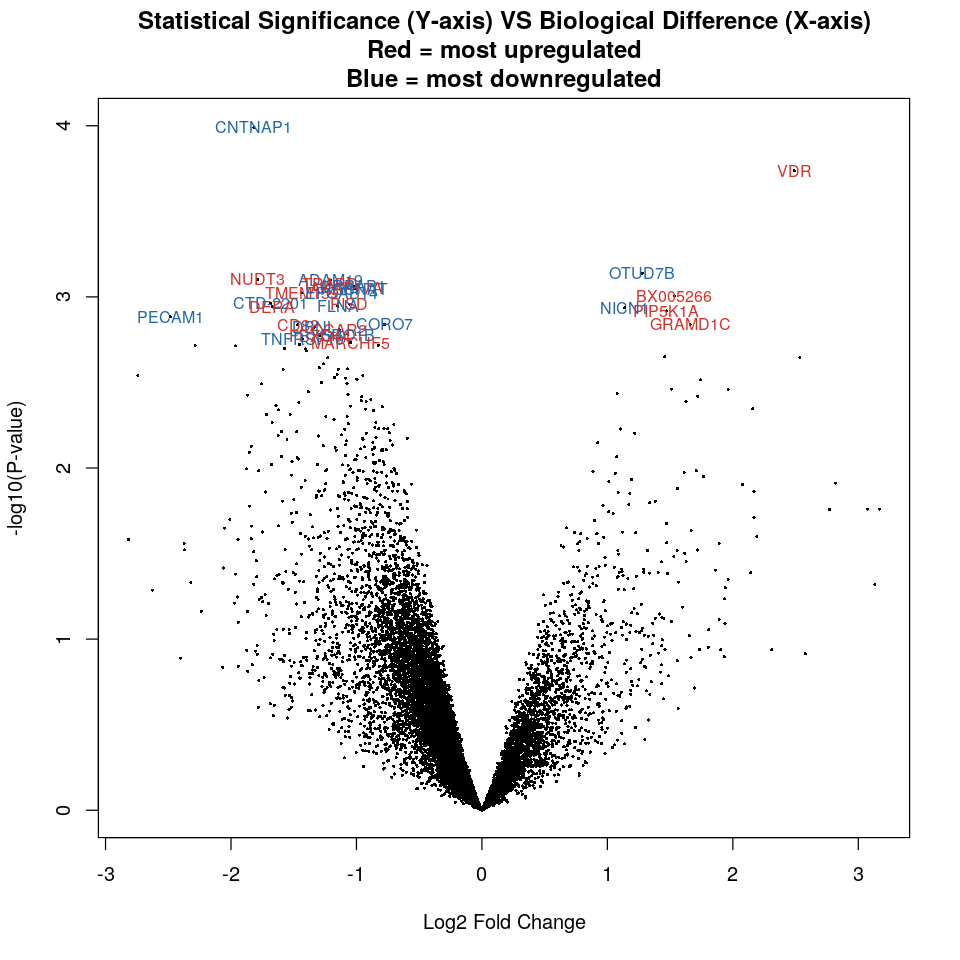

In [387]:
# Volcano plot
# simultaneously assess the P values (statistical significance) 
# and log ratios (biological difference) of differential expression
options(repr.plot.width=8, repr.plot.height=8)
volcanoplot(efit, 
            coef=3, 
            highlight=30, 
            names = efit$genes$SYMBOL, 
            main = "Statistical Significance (Y-axis) VS Biological Difference (X-axis)\nRed = most upregulated\nBlue = most downregulated",
            hl.col= c(brewer.pal(8, "RdBu")[8], brewer.pal(8, "RdYlBu")[1]),
            ylim=c(0,4))
invisible(dev.print(png, "LIMMA_RES/LIMMA_stringtie_volcano.png", width=480, height=480))

In [388]:
# decideTest: classify a series of related t-statistics as up, down or not significant
dt <- decideTests(efit,method="hierarchical",lfc=log2(1.5),adjust.method="fdr")
summary_test <- capture.output(summary(dt[,3]))
fileConn<-file("LIMMA_RES/LIMMA_stringtie_resultsSummary_decideTest.txt")
writeLines(summary_test, fileConn)
close(fileConn)
summary(dt[,3])

       T - C
Down     588
NotSig 12655
Up       113

In [389]:
write.fit(efit, 
          dt, 
          file="LIMMA_RES/LIMMA_stringtie_results_EFIT.txt", 
          sep="\t", 
          row.names=TRUE)

In [390]:
# top differentially expressed genes
de_genes <- which(dt[,3]!=0)
head(treat_efit$genes$SYMBOL[de_genes], n=20)

[1] TIGAR      MRM3       ACOXL-AS1  ZNF767P    SRGAP3     AC139768.1
 [7] USP3-AS1   FLYWCH2    PIGA       GALC       DOCK10     CD48      
[13] CAPN3      HLA-DPB1   SNHG6      NARS2      PISD       ERO1B     
[19] SBNO2      ZNF622    
29106 Levels: 7SK A1BG A1BG-AS1 A2M A2M-AS1 A2ML1 A2ML1-AS1 A2ML1-AS2 ... ZZZ3

In [391]:
# top downregulated genes
down_genes <- which(dt[,3]==-1)
head(treat_efit$genes$SYMBOL[down_genes], n=20)

[1] TIGAR      MRM3       ZNF767P    SRGAP3     AC139768.1 USP3-AS1  
 [7] FLYWCH2    PIGA       GALC       DOCK10     CD48       CAPN3     
[13] HLA-DPB1   SNHG6      PISD       ERO1B      SBNO2      ZNF622    
[19] TYK2       LRIG1     
29106 Levels: 7SK A1BG A1BG-AS1 A2M A2M-AS1 A2ML1 A2ML1-AS1 A2ML1-AS2 ... ZZZ3

In [392]:
# top upregulated genes
up_genes <- which(dt[,3]==1)
head(treat_efit$genes$SYMBOL[up_genes], n=20)

[1] ACOXL-AS1 NARS2     IFIT2     UNC5CL    PPFIA3    PLAG1     HLA-B    
 [8] DPP3      SERPINB6  MED1      PIP5K1A   NOB1      PPP3R1    MRPS35   
[15] STING1    PNPT1     KIF2A     FMO4      USP32P3   PTPN11   
29106 Levels: 7SK A1BG A1BG-AS1 A2M A2M-AS1 A2ML1 A2ML1-AS1 A2ML1-AS2 ... ZZZ3

In [393]:
# top DE genes
# AveExpr: Average expression across all samples, in log2 CPM
# F: logFC divided by its standard error
# P.Value: Raw p-value (based on F) from test that logFC differs from 0
# adj.P.Val: Benjamini-Hochberg false discovery rate adjusted p-value
# --> Gene X has different expression in C and T...
# --> topTable generates a table of differentially expressed probesets
table_efit <- topTable(efit, coef=3, sort.by = "P", n = Inf)
head(table_efit, 20)

,ENSEMBL,SYMBOL,logFC,AveExpr,t,P.Value,adj.P.Val,B
,<fct>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000153339,ENSG00000153339,TRAPPC8,-1.835146,28.49919,-5.246446,4.871769e-05,0.4112381,-0.2873844
ENSG00000279561,ENSG00000279561,AL845472.2,1.722746,25.27812,5.139506,6.158103e-05,0.4112381,-1.1755501
ENSG00000108797,ENSG00000108797,CNTNAP1,-1.816850,27.21545,-4.911851,1.017839e-04,0.4531421,-0.9191786
ENSG00000111424,ENSG00000111424,VDR,2.488096,25.03042,4.647292,1.835341e-04,0.6128203,-1.5769009
ENSG00000264522,ENSG00000264522,OTUD7B,1.277040,26.73683,4.036588,7.272022e-04,0.7467560,-1.8649274
ENSG00000272325,ENSG00000272325,NUDT3,-1.788752,31.38853,-3.999778,7.904294e-04,0.7467560,-1.3794065
ENSG00000135074,ENSG00000135074,ADAM19,-1.203939,29.27861,-3.995980,7.972589e-04,0.7467560,-1.5010123
ENSG00000170638,ENSG00000170638,TRABD,-1.213138,29.15768,-3.970819,8.440174e-04,0.7467560,-1.5412144
ENSG00000163956,ENSG00000163956,LRPAP1,-1.012216,29.64089,-3.960432,8.641130e-04,0.7467560,-1.5185916


In [394]:
# how many DE genes with P.Val < 0.1
length(which(table_efit$P.Val < 0.1))

[1] 1606

In [395]:
write.table(table_efit, 
          file="LIMMA_RES/LIMMA_stringtie_results_topTable_efit.txt", 
          sep="\t", 
          row.names=TRUE)

In [396]:
# adding the status to genes
efit$genes$Status <- dt[,3]

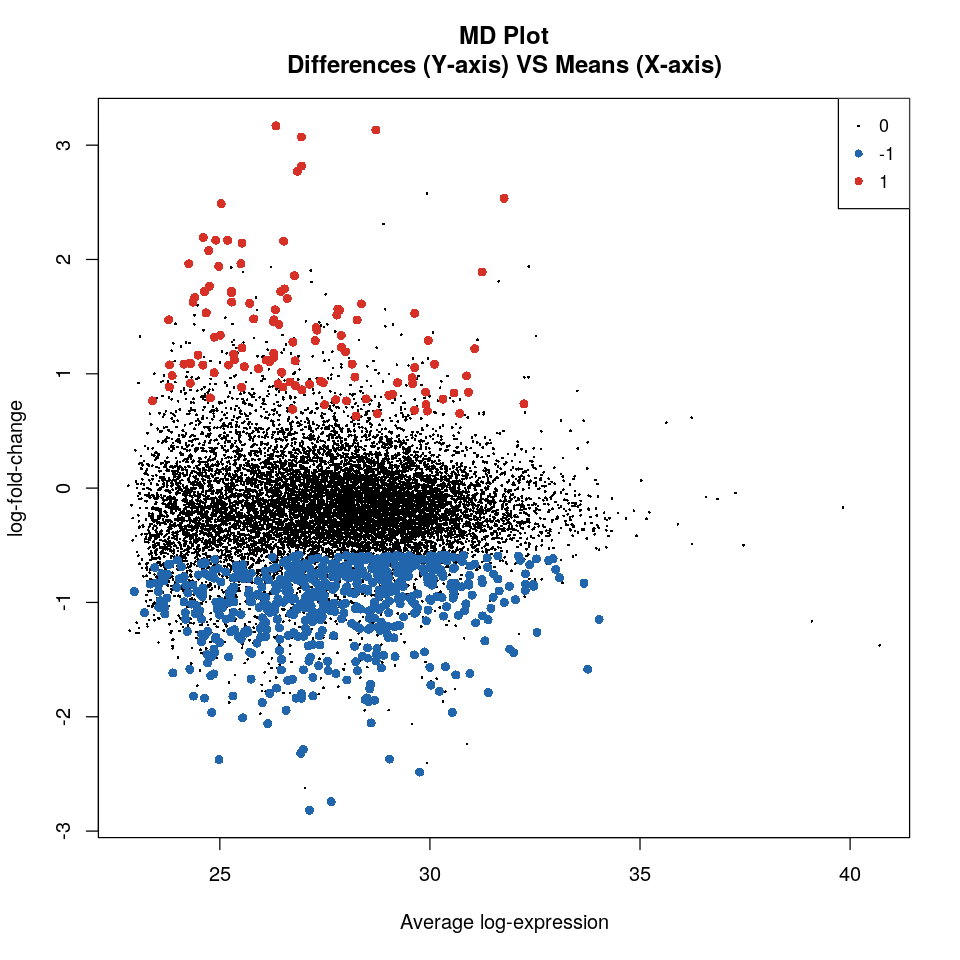

In [397]:
# Mean-difference plot
# log fold changes (differences) versus average log values (means)
options(repr.plot.width=8, repr.plot.height=8)
plotMD(efit,coef=3, 
       status=efit$genes$Status,
       main="MD Plot\nDifferences (Y-axis) VS Means (X-axis)", 
       hl.col= c(brewer.pal(8, "RdBu")[8], brewer.pal(8, "RdYlBu")[1]),
        values=c(-1,1))
invisible(dev.print(png, "LIMMA_RES/LIMMA_stringtie_MD_plot.png", width=480, height=480))


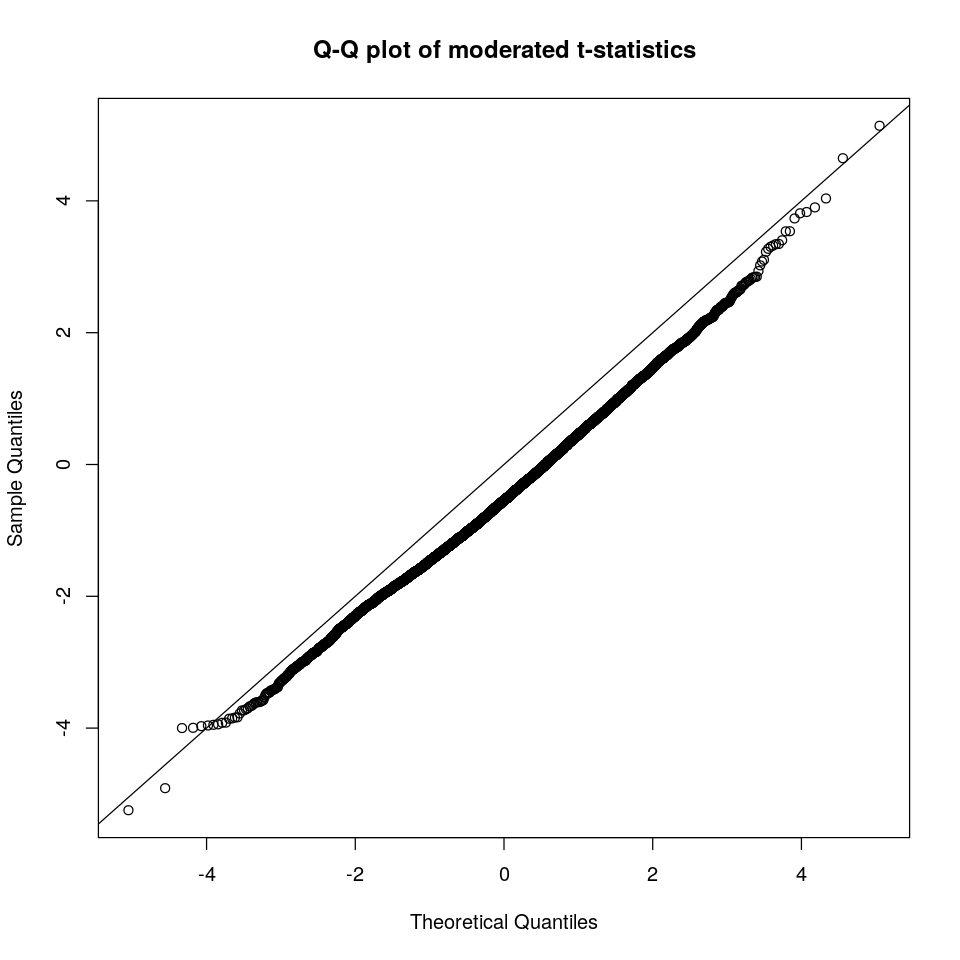

In [398]:
# Q-Q plot of moderated t-statistics
# Plots the quantiles of a data sample against 
# the theoretical quantiles of a Student's t distribution
qqt(efit$t[,3],df=efit$df.residual+efit$df.prior, main ="Q-Q plot of moderated t-statistics")
abline(0,1)
invisible(dev.print(png, "LIMMA_RES/LIMMA_stringtie_QQ_plot.png", width=480, height=480))